In [52]:
from pathlib import Path
import nibabel as nib
import numpy as np
import os
import sys
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from cmath import phase
# from numpy.linalg import eig as eigenvectors
import pandas as pd
from datetime import date
import random
import scipy.io

import matplotlib as mpl
import pickle
import scipy
import mat73
# from statannotations.Annotator import Annotator
import seaborn as sns
import igraph as ig

from tqdm import tqdm

from numpy.linalg import eigh as eigenvectors #compute real eigenvec and eigenvals (only for symmetric or Hermitian matrices)
from scipy.sparse.linalg import eigsh # BAD - but I don't know why
import networkx as nx
from sklearn import linear_model
from scipy.stats import brunnermunzel

# PCA
from sklearn.decomposition import PCA
import pandas as pd

# K-MEANS
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.metrics import homogeneity_score, completeness_score, v_measure_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.mixture import GaussianMixture
from scipy.stats import multivariate_normal as mvn
from sklearn.preprocessing import MinMaxScaler

# Stat test
from scipy.stats import ttest_ind, ttest_1samp, pearsonr
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

# Similaritys
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial.distance import euclidean
import sklearn

# Normalization
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from scipy.spatial import distance

# from nilearn import plotting
from scipy.cluster.vq import vq
from numpy.linalg import norm

# statistics
import pingouin as pg
from statannotations.Annotator import Annotator

from scipy.stats import zscore
# from scipy.stats import norm # to compute p-value
from sklearn.utils import shuffle

# ENIGMA PLOTS
sys.path.append('../src')
from utils_neuromaps_brain import plot_adjustments, truncate_colormap, normal_view, full_view, compose_full_view

from utils_stat import cohen, annotate_D, conf_int_pval
from utils_graph import graph_metrics, Digraph_metrics, cort_subcort_connectivity, homotopic_connectivity
from utils import utri2mat, mov_av_smooth, find_the_min, boool
from utils_plot import plot_ordered_fc, plot_array, plot_arrays
    
# NILEARN
from nilearn import plotting

from skimage.metrics import structural_similarity as ssim

In [51]:
my_pal = {'C':'blue', 'B':'g', 'NB':'r'}

In [3]:
# Get data path
cwd = Path(os.getcwd())
pardir = str(cwd.parent.absolute())
projdir = os.path.dirname(pardir)
projdir = os.path.dirname(projdir)
pardir, projdir

('/home/alessio/projects/Blindsight_LEIDA', '/home/alessio')

In [4]:
sns.__version__

'0.11.2'

In [5]:
# !pip uninstall seaborn
# # !pip install seaborn==0.11.2 # for statsannotations
# !pip install seaborn==0.13.2 # for annotion over heatmaps

In [6]:
n_sub = 33

## Load atlas

In [7]:
# Shafer
path = pardir+'/data/atlas/schafer/Schaefer2018_200Parcels_7Networks_plus_TIAN_SC_LGN_order_FSLMNI152_2.4mm.nii.gz'
path_lab = pardir+'/data/atlas/schafer/Schaefer2018_200Parcels_7Networks_plus_TIAN_SC_LGN.csv'
atlas_ = nib.load(path)
atlas = atlas_.get_fdata()
atlas_header = atlas_.header
atlas_affine = atlas_.affine
print(atlas.shape)


atlas_labels = pd.read_csv(path_lab, delimiter=';')
# atlas_labels.rename(columns = {0:'from', 1:'hemisphere',2:'network',3:'super network',4:'area',5:'count'}, inplace = True)
# atlas_labels.replace('Diano', 'Tian', inplace=True)
# bastardi = np.unique(atlas_labels[atlas_labels['from']=='Tian']['network'].values)
# for basta in bastardi:
#     atlas_labels.replace(basta, 'subcortical', inplace=True)
# nodes_labels = atlas_labels['area'].values

# n_area = []
# for n,a in zip(atlas_labels['network'].values, atlas_labels['area'].values):
#     n_area.append(n +'-'+a)
# atlas_labels['n_area'] = n_area

atlas_labels

(75, 90, 75)


,ROI_label,ROI_name,ROI_network,Hemisphere
0,1,LH_Vis_1,Vis,LH
1,2,LH_Vis_2,Vis,LH
2,3,LH_Vis_3,Vis,LH
3,4,LH_Vis_4,Vis,LH
4,5,LH_Vis_5,Vis,LH
...,...,...,...,...
231,232,LH_pCAU,Subcortical,LH
232,233,LH_SC,Subcortical,LH
233,234,RH_SC,Subcortical,RH
234,235,LH_LGN,Subcortical,LH


In [8]:
# Divides the nodes in macro areas
# Divide areas for network
networks = np.unique(atlas_labels['ROI_network'].values)
net_idx = {}
net_dic = {} # Area index associated to each macro area (as dictionary keys)
net_list = [] # same as mas_dic, but as a concatenation of list
for ne_idx, ne in enumerate(networks):
    net_dic[ne] = atlas_labels.index[atlas_labels['ROI_network']==ne].tolist()
    net_list.append(atlas_labels.index[atlas_labels['ROI_network']==ne].tolist())

In [9]:
# GLASSER
# Shafer
path = pardir+'/data/atlas/glasser/Glasser_Tian_SC_BlindsightResamp.nii.gz'
path_lab = pardir+'/data/atlas/glasser/atlas_finev1.csv'
glasser_ = nib.load(path)
glasser = glasser_.get_fdata()
glasser_header = glasser_.header
glasser_affine = glasser_.affine
print(glasser.shape)


glasser_labels = pd.read_csv(path_lab, delimiter=';')
# glasser_labels.rename(columns = {0:'from', 1:'hemisphere',2:'network',3:'super network',4:'area',5:'count'}, inplace = True)
# glasser_labels.replace('Diano', 'Tian', inplace=True)

(75, 90, 75)


## Glasser - Schaefer match

In [10]:
glasser_labels

,Hemisphere,Area,Macro Area
0,LH,L_V1,Primary Visual Cortex
1,LH,L_MST,MT+ Complex and Neighboring Visual Areas
2,LH,L_V6,Dorsal Stream Visual Cortex
3,LH,L_V2,Early Visual Cortex
4,LH,L_V3,Early Visual Cortex
...,...,...,...
389,RH,R_Caud_post,Tian_Caudate
390,RH,R_Pall_post,Tian_Pallidus
391,RH,R_Put_post,Tian_Putamen
392,LH,L_Substantia_Nigra,Substantia_Nigra


In [11]:
print(glasser_labels.loc[glasser_labels['Area']=='L_MT'].index,
      glasser_labels.loc[glasser_labels['Area']=='R_MT'].index,
      glasser_labels.loc[glasser_labels['Area']=='L_V1'].index,
      glasser_labels.loc[glasser_labels['Area']=='R_V1'].index)

Index([22], dtype='int64') Index([203], dtype='int64') Index([0], dtype='int64') Index([181], dtype='int64')


In [12]:
# my_areas = ['L_MT','R_MT','L_V1','R_V1']
my_areas = ['L_MT','R_MT']

for a in my_areas:
    a_cord = np.where(glasser==glasser_labels.loc[glasser_labels['Area']==a].index[0]+1)
    print(np.unique(atlas[a_cord[0], a_cord[1], a_cord[2]])+1) # schafer

[1. 4. 9.]
[106. 112. 137.]


In [13]:
L_MT_idx = [4, 9]
R_MT_idx = [106,112,137]

## Load subjects informations

In [14]:
classif = pd.read_excel(pardir+'/data/MD_05122023/davide_class_blindsight.xlsx')
# classif.drop(labels='Unnamed: 3', axis=1, inplace=True)
# new = classif['NEW ID'].values
# old = classif['OLD ID'].values
group = classif['CLASS'].values
# time_points = int(time_all.shape[1]/len(group))
group_dic = {'C':0, 'B':1, 'NB':2}

In [15]:
subjects_code = classif['ID'].values
subjects_group = classif['CLASS'].values
n_sub = len(subjects_code)

B_code = []
NB_code = []
C_code = []
for sub_i, sub in enumerate(subjects_code):
    if subjects_group[sub_i]=='B':
        B_code.append(sub)
    elif subjects_group[sub_i]=='NB':
        NB_code.append(sub)
    elif subjects_group[sub_i]=='C':
        C_code.append(sub)
    

# Load LIEDA results

In [16]:
# state_labels
path = pardir + '/data/AB_15052024/clustering_res.mat'
kmeans_leida_ = mat73.loadmat(path)
print(kmeans_leida_.keys())
kmeans_leida = kmeans_leida_['Kmeans_results']
# kmeans_leida = kmeans_leida_['Kmeans_results']
K_max = len(kmeans_leida) + 3
print(kmeans_leida[0].keys())

K = 4
k = K-2
kmeans_leida[k].keys()
centroids = kmeans_leida[k]['C']

dict_keys(['Kmeans_results', 'mal_dist_kmean'])
dict_keys(['C', 'D', 'IDX', 'SUMD'])


In [17]:
# define a labeling for the each area according to dfc state
state_labels_vec = np.zeros((236,))
state_names_dic = {0:'DMN', 1:'Somatosensory', 2:'Visual', 3:'Subcortical'}
for i,c in enumerate(centroids[1:]):
    state_labels_vec[np.where(c>0)] = i
# Add also a Subcortical state
sc_idx = atlas_labels.loc[atlas_labels['ROI_network']=='Subcortical'].index.values
state_labels_vec[sc_idx] = 3

state_labels_list =  []
for a in state_labels_vec:
    state_labels_list.append(state_names_dic[a])

In [18]:
atlas_labels['ROI_state'] = state_labels_list

In [19]:
atlas_labels

,ROI_label,ROI_name,ROI_network,Hemisphere,ROI_state
0,1,LH_Vis_1,Vis,LH,Visual
1,2,LH_Vis_2,Vis,LH,Visual
2,3,LH_Vis_3,Vis,LH,Visual
3,4,LH_Vis_4,Vis,LH,Visual
4,5,LH_Vis_5,Vis,LH,Visual
...,...,...,...,...,...
231,232,LH_pCAU,Subcortical,LH,Subcortical
232,233,LH_SC,Subcortical,LH,Subcortical
233,234,RH_SC,Subcortical,RH,Subcortical
234,235,LH_LGN,Subcortical,LH,Subcortical


# Load Structural Connectivity

In [20]:
sc = scipy.io.loadmat('../data/StructuralConnectivity/healthy/healthy_average_all_sub_SC.mat')['connectivity']
sc = (sc - sc.min()) / (sc.max() - sc.min()) # normalization
SC_healthy = sc

SC_patients = []
for f in os.listdir('../data/StructuralConnectivity/patients'):
    sc = scipy.io.loadmat('../data/StructuralConnectivity/patients/'+f)['connectivity']
    sc = (sc - sc.min()) / (sc.max() - sc.min()) # normalization
    SC_patients.append(sc)

In [21]:
# Is the structural connectivity asymmetric?
# Healthy
print('HEALTHY')
m = SC_healthy
m_l = []
m_u = []
for i in range(234): # lower
    for j in range(234):
        if i<j: # lower
            m_l.append(m[i,j])
m_t = np.copy(m).transpose()
for i in range(234): # lower
    for j in range(234):
        if i<j: # lower
            m_u.append(m_t[i,j])

print(pearsonr(m_l, m_u))

# Patients
print('PATIENTS')
for m in SC_patients:
    m_l = []
    m_u = []
    for i in range(234): # lower
        for j in range(234):
            if i<j: # lower
                m_l.append(m[i,j])
    m_t = np.copy(m).transpose()
    for i in range(234): # lower
        for j in range(234):
            if i<j: # lower
                m_u.append(m_t[i,j])
    
    print(pearsonr(m_l, m_u))

HEALTHY
PearsonRResult(statistic=1.0, pvalue=0.0)
PATIENTS
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=0.9999999999999999, pvalue=0.0)
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=0.9999999999999998, pvalue=0.0)
PearsonRResult(statistic=0.9999999999999999, pvalue=0.0)
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=0.9999999999999999, pvalue=0.0)
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=1.0, pvalue=0.0)


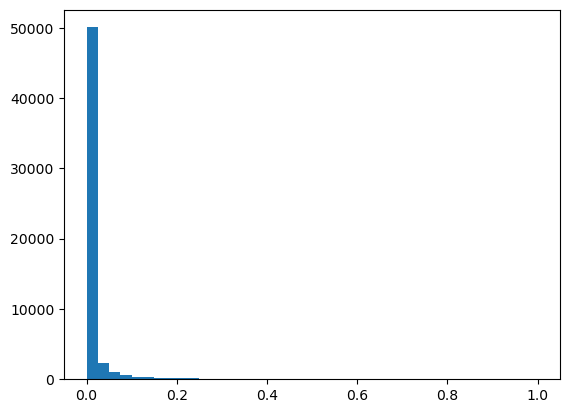

In [22]:
plt.hist(SC_patients[0].flatten(), bins=40);

# Load Effective Connectivity

/tmp/ipykernel_42209/54124518.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1,2, figsize=(10,3))


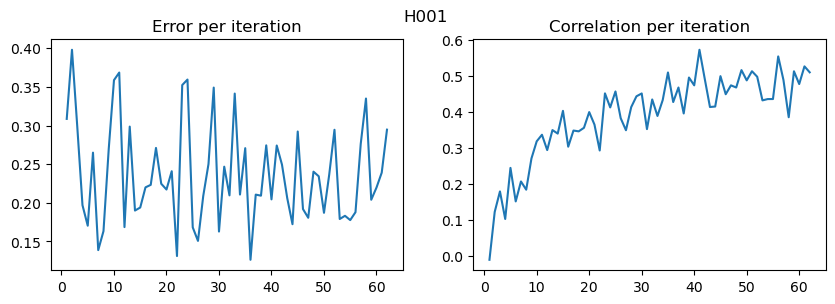

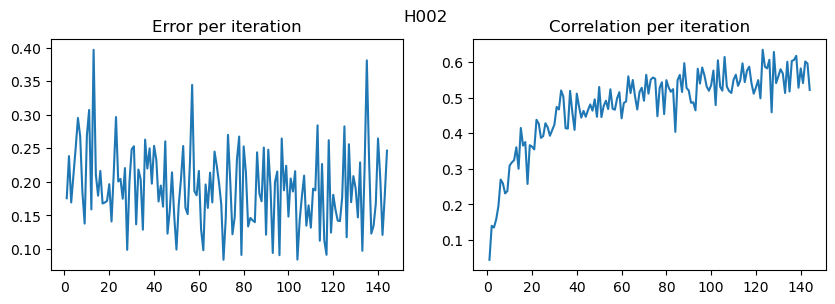

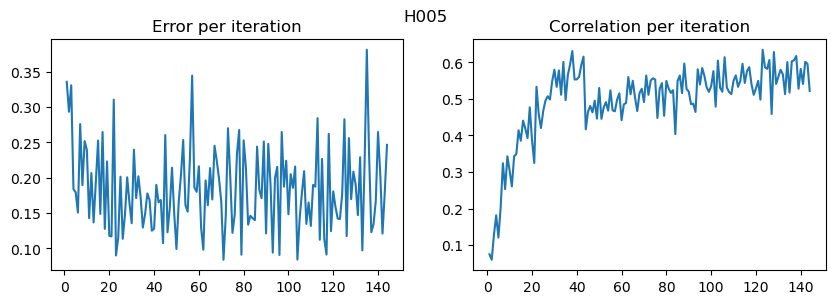

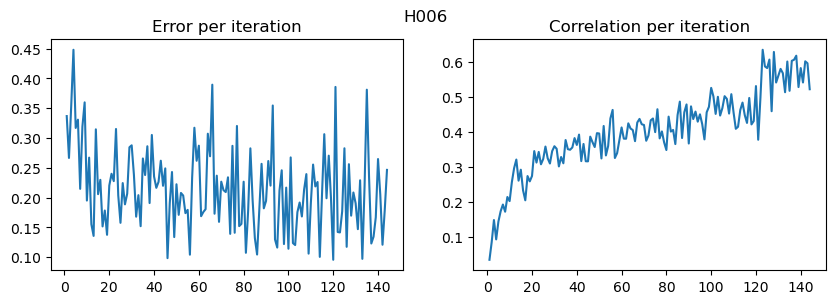

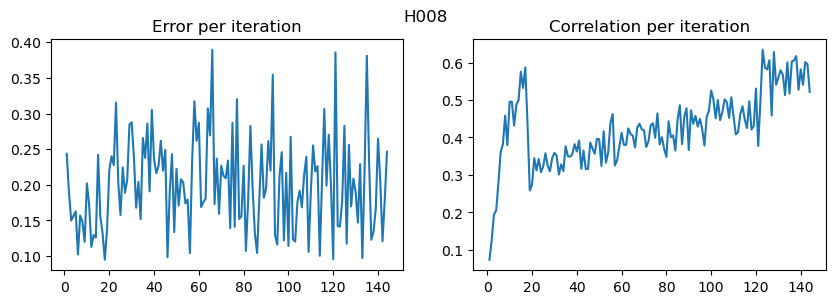

...

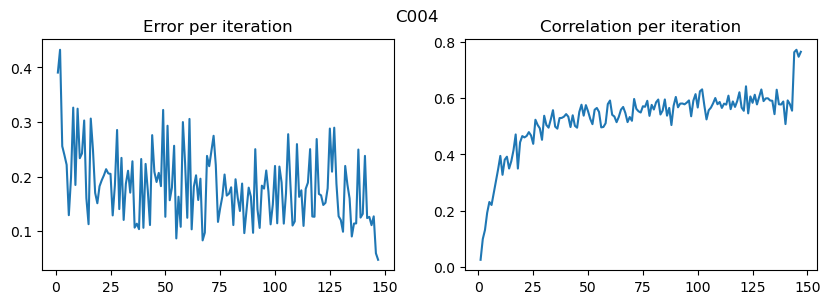

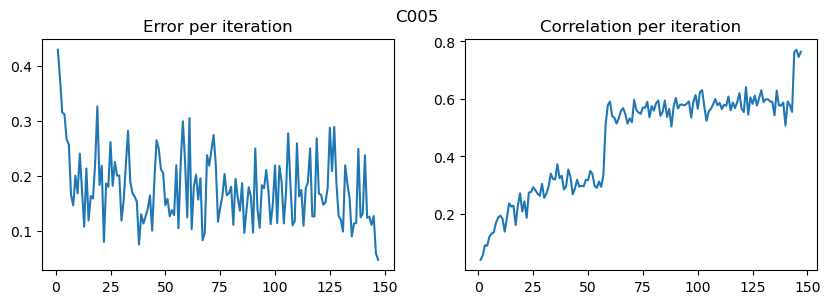

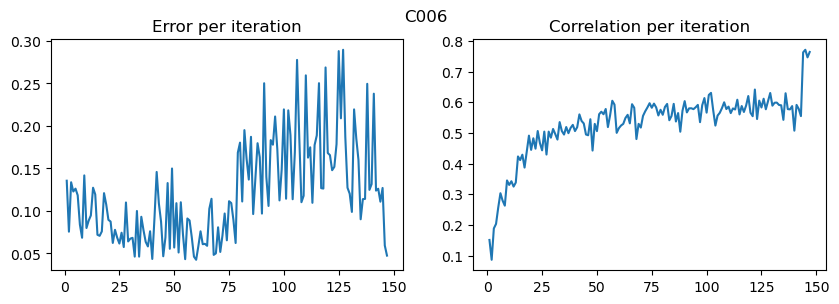

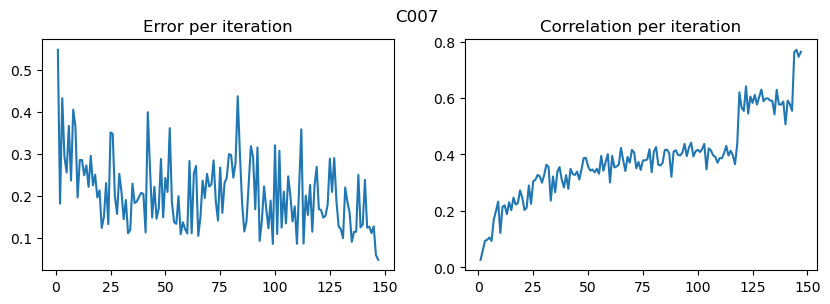

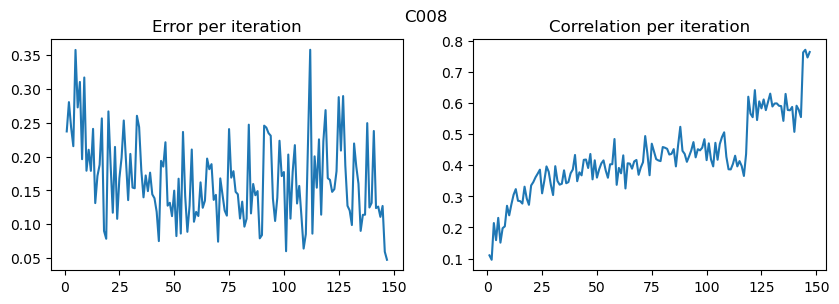

In [12]:
for sub in subjects_code:
    GEC_patient_err_corr = scipy.io.loadmat('../data/EffectiveConnectivity/EC_global/GEC_'+sub+'_err&corr.mat')
    err = GEC_patient_err_corr['errorFC']
    corr = GEC_patient_err_corr['corr_accum']
    fig, axs = plt.subplots(1,2, figsize=(10,3))
    plt.suptitle(sub)
    axs[0].plot([x+1 for x in range(err.shape[1])], err[0])
    axs[0].set_title('Error per iteration')
    axs[1].plot([x+1 for x in range(corr.shape[1])], corr[0])
    axs[1].set_title('Correlation per iteration')


In [23]:
GEC_sub = []
FC_sub = []
FCsim_sub = []
for sub in subjects_code:
#     if sub=='R011':
    GEC_subject = scipy.io.loadmat('../data/EffectiveConnectivity/EC_global/GEC_'+sub+'.mat')

    Cnew = GEC_subject['Cnew']
    FCemp = GEC_subject['FCemp']
    FCsim = GEC_subject['FCsim']
    GEC_sub.append(Cnew)
    FC_sub.append(FCemp)
    FCsim_sub.append(FCsim)
    

    # titles = ['Cnew', 'Fsim', 'FCemp']
    # fig, axs = plt.subplots(1,3, figsize=(15,4.5))
    # sns.heatmap(Cnew, square=True, ax=axs[0])
    # sns.heatmap(FCsim, square=True, ax=axs[1], cmap='viridis')
    # sns.heatmap(FCemp, square=True, ax=axs[2], cmap='viridis')
    # for i,ax in enumerate(axs.flat):
    #     ax.set_xticks([])
    #     ax.set_yticks([])
    #     ax.set_title(titles[i])
    # plt.suptitle('sub '+sub, y=1.05)
    # plt.tight_layout()
    # plt.savefig('output_global/Matrices_example.png', dpi=300)
    

/tmp/ipykernel_934082/58045936.py:93: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_934082/58045936.py:93: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


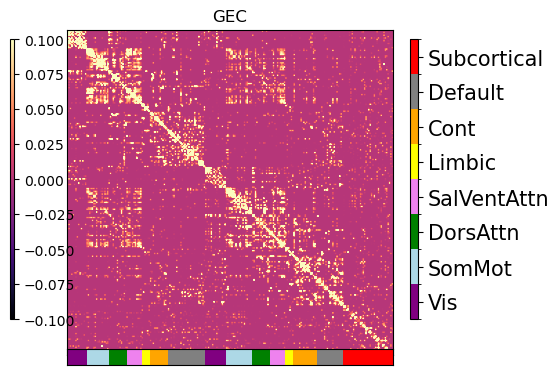

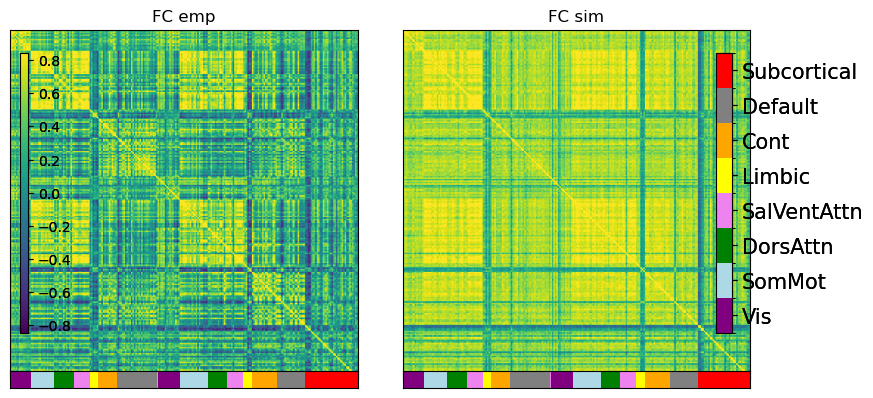

In [291]:
matrix = [GEC_sub[1]]
fig = plot_ordered_fc(matrix, ['GEC'], '', atlas, atlas_labels,  c_map='magma', x_cbar=-0.05, x_netbar=0.95)
plt.savefig('output_global/GEC_example.png', dpi=300)

matrix = [FC_sub[1], FCsim_sub[1]]
fig = plot_ordered_fc(matrix, ['FC emp','FC sim'], '', atlas, atlas_labels,  c_map='viridis', x_cbar=0.05, x_netbar=0.92)
plt.savefig('output_global/FC_example.png', dpi=300)


In [292]:
import matplotlib as mpl
import matplotlib.pyplot as plt 
import numpy as np

max = lambda a,b:a if a > b else b
def plot_ordered_fc(matrix, matrix_label, suptitle, atlas, atlas_labels, c_map='viridis', x_cbar=-0.05, x_netbar=0.92):
    """
    matrix: matrix I want to plot
    matrix_label: label of the matrix

    """
    
    N_mat = len(matrix)

    N=int(atlas.max()) # Number of areas
    
    dic = {}
    for i,n in enumerate(atlas_labels['ROI_network'].unique()):
        dic[n] = i
    
    super_area_indx = [dic[a] for a in atlas_labels['ROI_network'].to_numpy()]
    super_area_indx = np.asarray(super_area_indx)
    
    alpha=1
    
    # Add an additional color for the first 16 elements
    colors = [
              mpl.colors.to_rgba('purple',alpha), #Attention
              mpl.colors.to_rgba('lightblue',alpha), #Auditive
              mpl.colors.to_rgba('green',alpha), #Control  
              mpl.colors.to_rgba('violet',alpha),#Default
              mpl.colors.to_rgba('yellow',alpha), #Language
              mpl.colors.to_rgba('orange',alpha), #Somatomotor
              mpl.colors.to_rgba('gray', alpha),  # Subcortical
              mpl.colors.to_rgba('red',alpha), #Visual
             ]
    
    n_bin = np.unique(list(atlas_labels['ROI_network'])).shape[0] # Increment number of bins
    cmap_name = 'my_list'
    cmap = mpl.colors.LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bin)
    family = super_area_indx
        
    # Define your labels for each color
    labels = atlas_labels['ROI_network'].unique()
        
    vmin = np.min(matrix)
    vmax = np.min(matrix)
    vtot = max(vmax,abs(vmin))

    ### PLOT ###
    cmap_ = plt.get_cmap(c_map)
    fig, axs = plt.subplots(nrows=1, ncols=N_mat, figsize=(4*N_mat, 4))
    fig.suptitle(suptitle)
    for i in range(N_mat):
        if N_mat>1:
            ax = axs[i]
        else:
            ax = axs
        # Plot the matrix
        im = ax.imshow(matrix[i], vmin=-vtot, vmax=vtot, cmap=c_map)
        ax.set_title(matrix_label[i])
        ax.set_xticks([])
        ax.set_yticks([])
    
        # Plot the family color bar at the bottom of the matrix
        cax_bottom = ax.inset_axes([0, -0.03, 1, 0.05])  # adjust [left, bottom, width, height] as needed
        cax_bottom.imshow(family[np.newaxis, :], aspect='auto', cmap=cmap)
        cax_bottom.set_yticks([])
        cax_bottom.set_xticks([])
        
        # Set the boundaries to match your data
        boundaries = [0]  # start with 0
        
        # Add the boundary for the first color
        boundaries.append(16)
        
        # Add the boundaries for the rest of the colors
        for i in range(2, n_bin+1):
            boundaries.append(boundaries[-1] + 10)
        
        # Create a color bar legend with labels
        cax_legend = fig.add_axes([x_netbar, 0.15, 0.02, 0.7])  # adjust [left, bottom, width, height] as needed
        norm = mpl.colors.BoundaryNorm(boundaries, cmap.N)
        cb = mpl.colorbar.ColorbarBase(cax_legend, cmap=cmap, norm=norm, 
                                       ticks=np.array(boundaries[:-1]) + np.diff(boundaries) / 2,  # set ticks at the middle of boundaries
                                       orientation='vertical')
    
        cb.set_ticklabels(labels, fontsize=15)  # set fontsize to desired value
            
        # Add common colorbar
        cbar_ax = fig.add_axes([x_cbar, 0.15, 0.01, 0.7]) # Adjust as necessary.
        fig.colorbar(im, cax=cbar_ax, orientation='vertical')
    return fig

# Load INSIDEOUT results 

In [24]:
path = '../data/INSIDEOUT/InsideOut_AllSub.mat'
I_global = scipy.io.loadmat(path)['FowRev']
I_matrix = scipy.io.loadmat(path)['I_matrix']
df = pd.DataFrame({'I': I_global[:,0], 'group': subjects_group})
I_per_area = np.zeros((33,236))
for i,sub in enumerate(I_matrix):
    I_per_area[i] =np.mean(sub,axis=1) 

print(I_global.shape, I_matrix.shape, I_per_area.shape)

(33, 1) (33, 236, 236) (33, 236)


In [25]:
# # Simmetry of the irreversibility matrices
# for sub_i,sub in enumerate(subjects_code):
#     print(sub)
#     m = I_matrix[sub_i]
#     m_l = []
#     m_u = []
#     for i in range(236): # lower
#         for j in range(236):
#             if i<j: # lower
#                 m_l.append(m[i,j])
#     m_t = np.copy(m).transpose()
#     for i in range(236): # lower
#         for j in range(236):
#             if i<j: # lower
#                 m_u.append(m_t[i,j])

#     print(pearsonr(m_l, m_u))

# EC values distribution

In [15]:
print(GEC_sub[0].min(), GEC_sub[0].max())


0.0 1.0


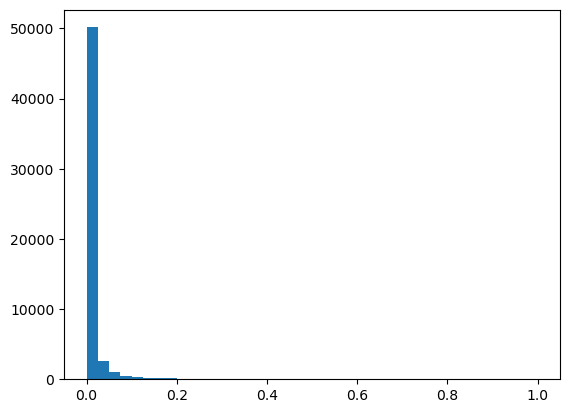

In [16]:
plt.hist(GEC_sub[0].flatten(), bins=40);

# Is the effective connectivity asymmetric?

In [27]:
for sub_i,sub in enumerate(subjects_code):
    print(sub)
    m = GEC_sub[sub_i]
    m_l = []
    m_u = []
    for i in range(234): # lower
        for j in range(234):
            if i<j: # lower
                m_l.append(m[i,j])
    m_t = np.copy(m).transpose()
    for i in range(234): # lower
        for j in range(234):
            if i<j: # lower
                m_u.append(m_t[i,j])

    print(pearsonr(m_l, m_u))

H001
PearsonRResult(statistic=0.9999294127232785, pvalue=0.0)
H002
PearsonRResult(statistic=0.9990684246908409, pvalue=0.0)
H005
PearsonRResult(statistic=0.9999607887218871, pvalue=0.0)
H006
PearsonRResult(statistic=0.9993982716182401, pvalue=0.0)
H008
PearsonRResult(statistic=0.9999529309379867, pvalue=0.0)
H009
PearsonRResult(statistic=0.9993243052956903, pvalue=0.0)
H010
PearsonRResult(statistic=0.9999240487887139, pvalue=0.0)
R006
PearsonRResult(statistic=0.9993690049718211, pvalue=0.0)
R011
PearsonRResult(statistic=0.9993371972051287, pvalue=0.0)
R013
PearsonRResult(statistic=0.9997186706533214, pvalue=0.0)
R014
PearsonRResult(statistic=0.9997626107674367, pvalue=0.0)
R017
PearsonRResult(statistic=0.9998297698272016, pvalue=0.0)
R018
PearsonRResult(statistic=0.9992863740825472, pvalue=0.0)
R020
PearsonRResult(statistic=0.9983501727447822, pvalue=0.0)
R023
PearsonRResult(statistic=0.9999658317639996, pvalue=0.0)
R024
PearsonRResult(statistic=0.9997078488724067, pvalue=0.0)
23M
Pear

H001
7444
H002
6103
H005
5442
H006
8394
H008
7866
H009
7524
H010
7103
R006
10051
R011
12237
R013
5176
R014
6567
R017
5012
R018
6471
R020
6539
R023
12708
R024
9001
23M
17073
24F
6506
32M
8133
41F
13144
69M
8511
71M


/tmp/ipykernel_934082/2959637964.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(5,3))


8715
73M
11327
112SUB
7270
164SUB
5571
C001
7541
C002
8354
C003
9997
C004
6145
C005
5194
C006
8321
C007
6932
C008
5070


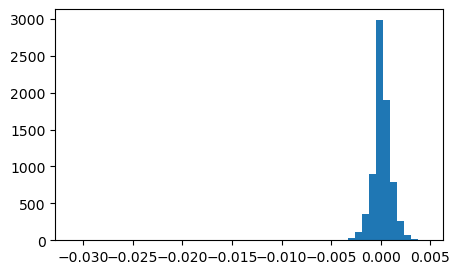

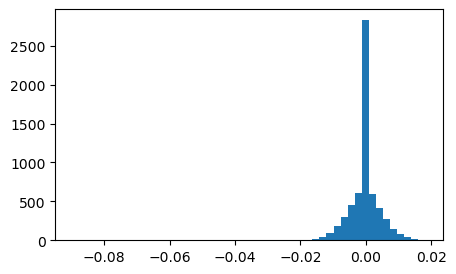

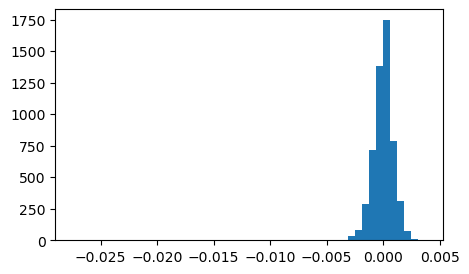

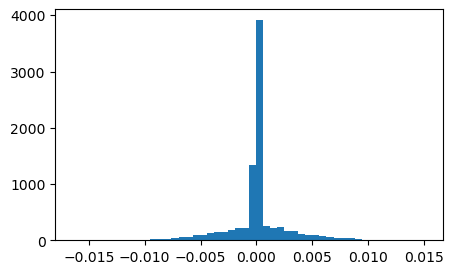

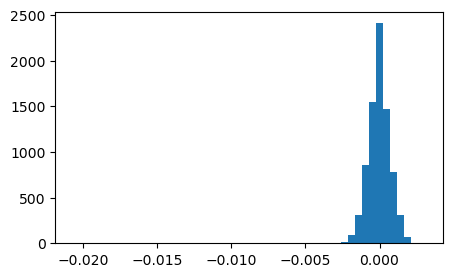

...

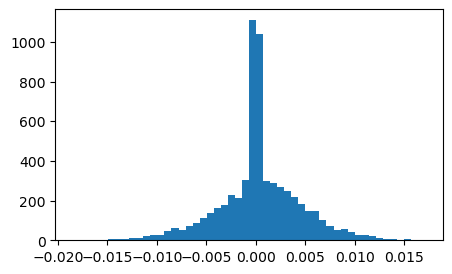

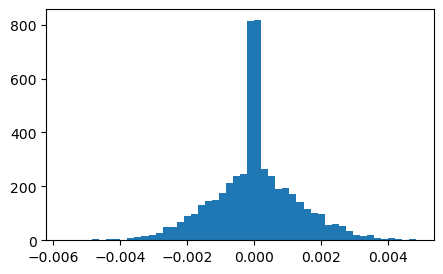

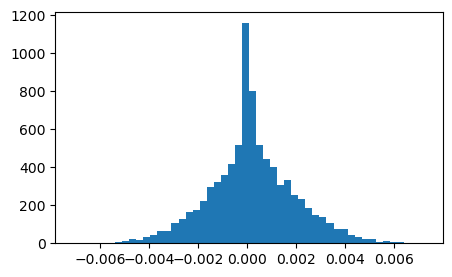

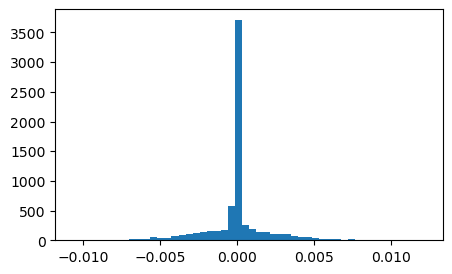

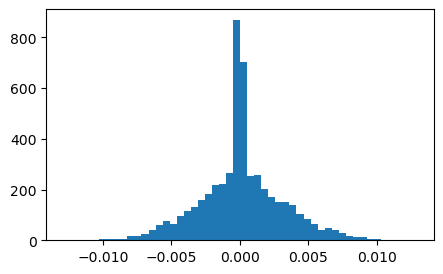

In [29]:
# How many connections have directionality of connections different from zero
for sub_i,sub in enumerate(subjects_code):
    print(sub)
    m = GEC_sub[sub_i]
    diffs = []
    for i in range(236):
        for j in range(236):
            if j<i:
                if m[i,j]-m[j,i] != 0:
                    diffs.append(m[i,j]-m[j,i])
    print(len(diffs))
    fig = plt.figure(figsize=(5,3))
    plt.hist(diffs, bins=50)
    # break

# Correlation between FC and SC

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: Brunner-Munzel test, P_val:1.941e-02 W=-2.516e+00
B vs. NB: Brunner-Munzel test, P_val:2.569e-01 W=1.182e+00
C vs. NB: Brunner-Munzel test, P_val:6.312e-01 W=-4.924e-01


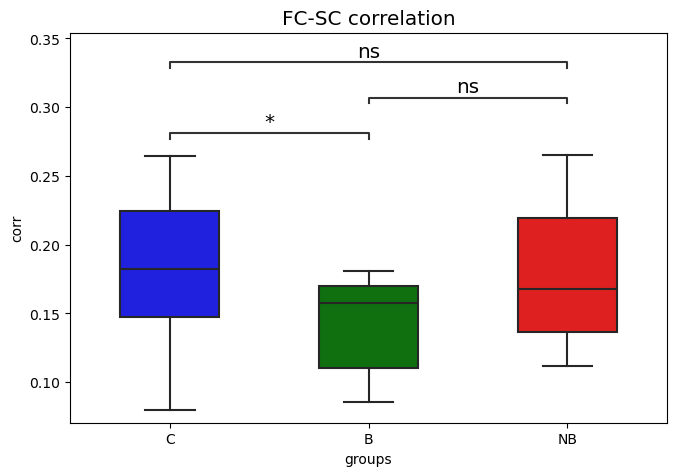

In [31]:
my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
annot_test =  'Brunner-Munzel'
# annot_test = 't-test_ind'
pairs = [('C','B'),('C','NB'),('B','NB')]
corr = []
groupz = []
patients_list = os.listdir('../data/StructuralConnectivity/patients')
for sub_i, sub in enumerate(subjects_code):
    group = subjects_group[sub_i]
    fc = FC_sub[sub_i]
    if group=='C':
        sc = SC_healthy
        corr.append(pearsonr(fc.flatten(),sc.flatten())[0])
        groupz.append(group)
    elif group=='B':
        idx = [pat_i for pat_i,pat in enumerate(patients_list) if sub in pat][0]
        sc = SC_patients[idx]
        corr.append(pearsonr(fc.flatten(),sc.flatten())[0])
        groupz.append(group)
    elif group=='NB':
        idx = [pat_i for pat_i,pat in enumerate(patients_list) if sub in pat][0]
        sc = SC_patients[idx]
        corr.append(pearsonr(fc.flatten(),sc.flatten())[0])
        groupz.append(group)
        
df = pd.DataFrame({'corr':corr, 'groups':groupz})
hue_plot_params = {
    'data': df,
    'x': 'groups',
    'y': 'corr',
    "order": ['C','B','NB'],
    "palette": my_pal
}
fig,ax = plt.subplots(1,1, figsize=(7,5))
with sns.plotting_context("notebook", font_scale = 1.2):
    sns.boxplot(**hue_plot_params, showfliers=False, width=0.5, ax=ax)
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test=annot_test, text_format='star', loc='inside')
                        # ,comparisons_correction='Benjamini-Hochberg')
    _, stat = annotator.apply_and_annotate()
    plt.title('FC-SC correlation')
    plt.tight_layout()

plt.savefig('output_global/FC-SC_correlation.png', dpi=200)

# Correlation between EC and SC

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: Brunner-Munzel test, P_val:4.359e-01 W=8.014e-01
B vs. NB: Brunner-Munzel test, P_val:1.326e-01 W=-1.600e+00
C vs. NB: Brunner-Munzel test, P_val:2.634e-01 W=-1.179e+00


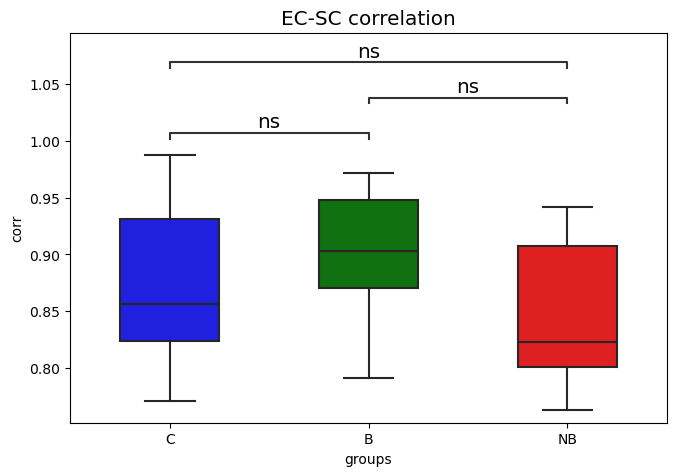

In [32]:
my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
annot_test =  'Brunner-Munzel'
# annot_test = 't-test_ind'
pairs = [('C','B'),('C','NB'),('B','NB')]
corr = []
groupz = []
patients_list = os.listdir('../data/StructuralConnectivity/patients')
for sub_i, sub in enumerate(subjects_code):
    group = subjects_group[sub_i]
    ec = GEC_sub[sub_i]
    if group=='C':
        sc = SC_healthy
        corr.append(pearsonr(ec.flatten(),sc.flatten())[0])
        groupz.append(group)
    elif group=='B':
        idx = [pat_i for pat_i,pat in enumerate(patients_list) if sub in pat][0]
        sc = SC_patients[idx]
        corr.append(pearsonr(ec.flatten(),sc.flatten())[0])
        groupz.append(group)
    elif group=='NB':
        idx = [pat_i for pat_i,pat in enumerate(patients_list) if sub in pat][0]
        sc = SC_patients[idx]
        corr.append(pearsonr(ec.flatten(),sc.flatten())[0])
        groupz.append(group)
        
df = pd.DataFrame({'corr':corr, 'groups':groupz})
hue_plot_params = {
    'data': df,
    'x': 'groups',
    'y': 'corr',
    "order": ['C','B','NB'],
    "palette": my_pal
}
fig,ax = plt.subplots(1,1, figsize=(7,5))
with sns.plotting_context("notebook", font_scale = 1.2):
    sns.boxplot(**hue_plot_params, showfliers=False, width=0.5, ax=ax)
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test=annot_test, text_format='star', loc='inside')
                        # ,comparisons_correction='Benjamini-Hochberg')
    _, stat = annotator.apply_and_annotate()
    plt.title('EC-SC correlation')
    plt.tight_layout()

plt.savefig('output_global/EC-SC_correlation.png', dpi=200)

# Correlation between FC and EC

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: Brunner-Munzel test, P_val:3.881e-02 W=-2.227e+00
B vs. NB: Brunner-Munzel test, P_val:2.838e-02 W=2.471e+00
C vs. NB: Brunner-Munzel test, P_val:4.550e-01 W=7.732e-01


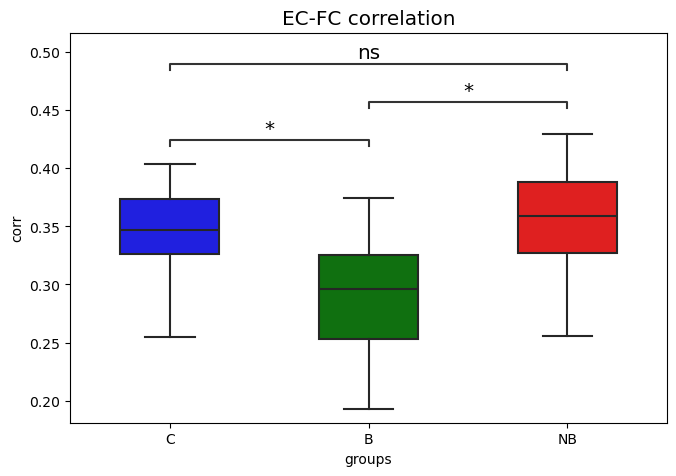

In [33]:
my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
annot_test =  'Brunner-Munzel'
# annot_test = 't-test_ind'
pairs = [('C','B'),('C','NB'),('B','NB')]
corr = []
groupz = []
patients_list = os.listdir('../data/StructuralConnectivity/patients')
for sub_i, sub in enumerate(subjects_code):
    group = subjects_group[sub_i]
    ec = GEC_sub[sub_i]
    fc = FC_sub[sub_i]
    if group=='C':
        sc = SC_healthy
        corr.append(pearsonr(ec.flatten(),fc.flatten())[0])
        groupz.append(group)
    elif group=='B':
        idx = [pat_i for pat_i,pat in enumerate(patients_list) if sub in pat][0]
        sc = SC_patients[idx]
        corr.append(pearsonr(ec.flatten(),fc.flatten())[0])
        groupz.append(group)
    elif group=='NB':
        idx = [pat_i for pat_i,pat in enumerate(patients_list) if sub in pat][0]
        sc = SC_patients[idx]
        corr.append(pearsonr(ec.flatten(),fc.flatten())[0])
        groupz.append(group)
        
df = pd.DataFrame({'corr':corr, 'groups':groupz})
hue_plot_params = {
    'data': df,
    'x': 'groups',
    'y': 'corr',
    "order": ['C','B','NB'],
    "palette": my_pal
}
fig,ax = plt.subplots(1,1, figsize=(7,5))
with sns.plotting_context("notebook", font_scale = 1.2):
    sns.boxplot(**hue_plot_params, showfliers=False, width=0.5, ax=ax)
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test=annot_test, text_format='star', loc='inside')
                        # ,comparisons_correction='Benjamini-Hochberg')
    _, stat = annotator.apply_and_annotate()
    plt.title('EC-FC correlation')
    plt.tight_layout()

plt.savefig('output_global/EC-FC_correlation.png', dpi=200)

# Check FC-SC connectivity per macro areas

HEMISPHERE  RH
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 3.33e-03 < p <= 1.67e-02
      **: 3.33e-04 < p <= 3.33e-03
     ***: 3.33e-05 < p <= 3.33e-04
    ****: p <= 3.33e-05

Control_C vs. Control_B: t-test independent samples, P_val:7.277e-02 t=1.880e+00
Attention_C vs. Attention_B: t-test independent samples, P_val:6.132e-02 t=1.967e+00
Auditory_C vs. Auditory_B: t-test independent samples, P_val:3.072e-01 t=1.044e+00
SomatoMotor_C vs. SomatoMotor_B: t-test independent samples, P_val:3.417e-01 t=9.709e-01
Visual_C vs. Visual_B: t-test independent samples, P_val:9.098e-03 t=2.848e+00
Subcortical_C vs. Subcortical_B: t-test independent samples, P_val:6.826e-01 t=4.142e-01
Language_B vs. Language_NB: t-test independent samples, P_val:6.647e-01 t=-4.428e-01
Control_B vs. Control_NB: t-test independent samples, P_val:7.561e-02 t=-1.919e+00
Attention_B vs. Attention_NB: t-test independent samples, P_val:5.656e-02 t=-2.078e+00
Auditory_B vs. Auditory_NB: t-test independ

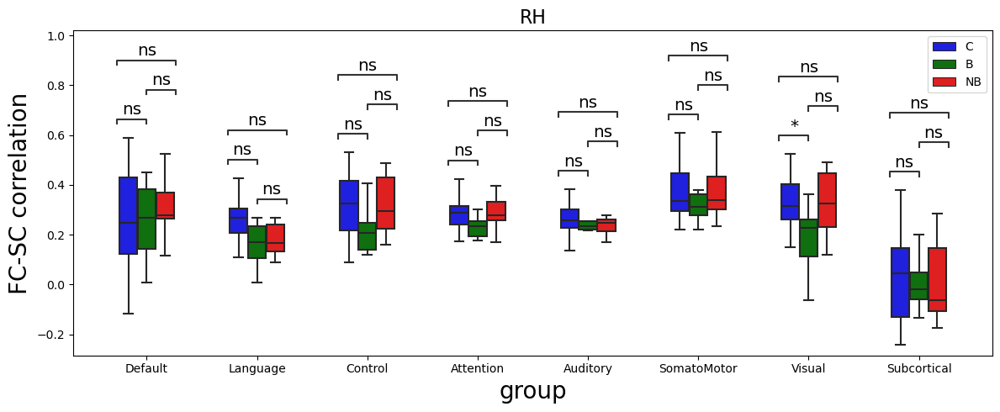

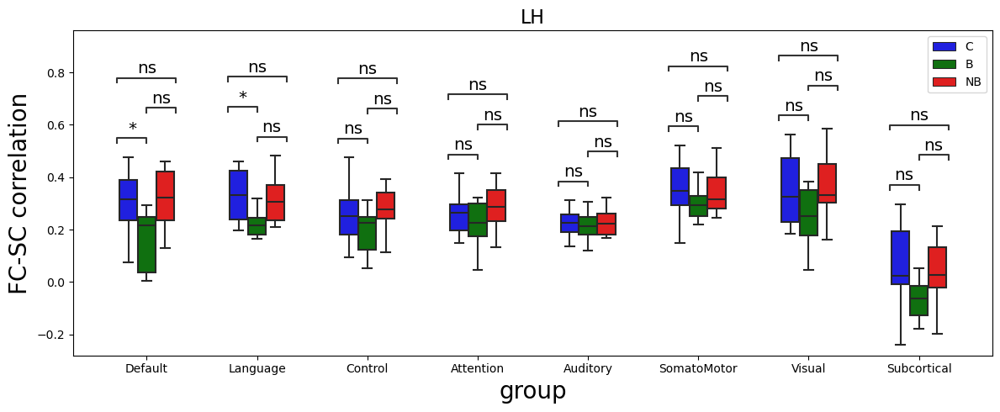

In [68]:
for hemi in ['RH','LH']:
    print('HEMISPHERE ', hemi)
    corr_per_net = []
    nets = []
    groups = []
    for sub in range(n_sub): # Loop over subjects
        group = subjects_group[sub]
        if group=='C':
            sc = SC_healthy
        else:
            idx = [pat_i for pat_i,pat in enumerate(patients_list) if subjects_code[sub] in pat][0]
            sc = SC_patients[idx]
        fc = FC_sub[sub]
                
        for network in super_networks: # Loop over all the networks
            network_idx = atlas_labels.loc[atlas_labels['super network']==network]
            network_idx = network_idx.loc[network_idx['hemisphere']==hemi].index.values
            fc_net = fc[network_idx,:].mean(axis=0)
            sc_net = sc[network_idx,:].mean(axis=0)
            corr = pearsonr(fc_net,sc_net)[0]
            # print(corr, network, group)
            
            
            corr_per_net.append(corr)
            nets.append(network)
            groups.append(group)

    df = pd.DataFrame({'corr':corr_per_net, 'network':nets, 'groups':groups})
    groups_order = ['C', 'B', 'NB']
    pairs = [[(k,'C'),(k,'B')] for k in super_networks] + \
             [[(k,'C'),(k,'NB')] for k in super_networks] + \
             [[(k,'B'),(k,'NB')] for k in super_networks]
    my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
    #     annot_test =  'Brunner-Munze'
    annot_test = 't-test_ind'
    
    hue_plot_params = {
        'data': df,
        'x': 'network',
        'y': 'corr',
        "order": super_networks,
        "hue": 'groups',
        "hue_order": groups_order,
        "palette": my_pal
    }
    
    fig,ax = plt.subplots(1,1, figsize=(12,5))
    with sns.plotting_context("notebook", font_scale = 1.2):
        # Create new plot
    #     ax = get_log_ax()
    
        # Plot with seaborn
        sns.boxplot(ax=ax, **hue_plot_params,
                         showfliers=False,
                         width=0.5)
        ax.set_xlabel('group',fontsize=20)
        ax.set_ylabel('FC-SC correlation', fontsize=20)
    
        # Add annotations
        annotator = Annotator(ax, pairs, **hue_plot_params)
        annotator.configure(test=annot_test, text_format='star', loc='inside')
                            # ,comparisons_correction='Benjamini-Hochberg')
        annotator._pvalue_format.pvalue_thresholds =  [[0.0001/3, '****'], [0.001/3, '***'], [0.01/3, '**'], [0.05/3, '*'], [1, 'ns']]
        _, stat = annotator.apply_and_annotate()
    
        # Label and show
        plt.legend(loc='upper right', fontsize=10, bbox_to_anchor=(1.0,1.0))
        plt.title(hemi, fontsize=16)
    plt.tight_layout()

    # plt.savefig('output_global/FC-SC_correlation_networks_'+hemi+'.png', dpi=200)

# Check EC-SC connectivity per macro areas

# Check EC-FC connectivity per macro areas

HEMISPHERE  RH
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 3.33e-03 < p <= 1.67e-02
      **: 3.33e-04 < p <= 3.33e-03
     ***: 3.33e-05 < p <= 3.33e-04
    ****: p <= 3.33e-05

Control_C vs. Control_B: t-test independent samples, P_val:9.675e-02 t=1.732e+00
Attention_C vs. Attention_B: t-test independent samples, P_val:1.432e-02 t=2.650e+00
Auditory_C vs. Auditory_B: t-test independent samples, P_val:4.477e-02 t=2.123e+00
SomatoMotor_C vs. SomatoMotor_B: t-test independent samples, P_val:1.068e-01 t=1.678e+00
Visual_C vs. Visual_B: t-test independent samples, P_val:1.122e-02 t=2.757e+00
Subcortical_C vs. Subcortical_B: t-test independent samples, P_val:4.257e-01 t=8.109e-01
Language_B vs. Language_NB: t-test independent samples, P_val:2.894e-01 t=-1.101e+00
Control_B vs. Control_NB: t-test independent samples, P_val:5.295e-02 t=-2.114e+00
Attention_B vs. Attention_NB: t-test independent samples, P_val:2.120e-01 t=-1.308e+00
Auditory_B vs. Auditory_NB: t-test independ

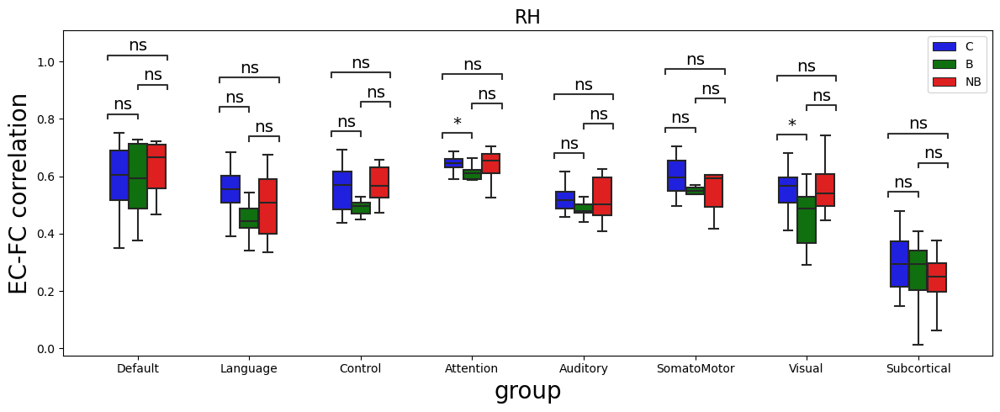

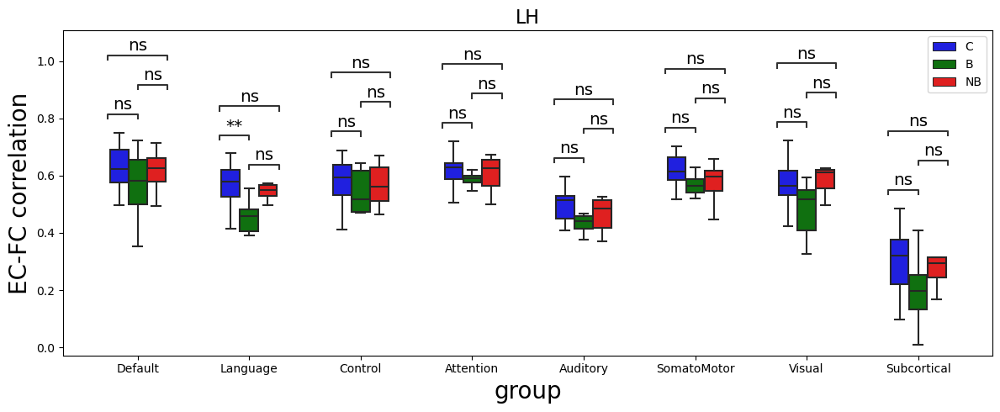

In [43]:
for hemi in ['RH','LH']:
    print('HEMISPHERE ', hemi)
    corr_per_net = []
    nets = []
    groups = []
    for sub in range(n_sub): # Loop over subjects
        group = subjects_group[sub]
        fc = FC_sub[sub]
        ec = GEC_sub[sub]
                
        for network in super_networks: # Loop over all the networks
            network_idx = atlas_labels.loc[atlas_labels['super network']==network]
            network_idx = network_idx.loc[network_idx['hemisphere']==hemi].index.values
            ec_net = ec[network_idx,:].mean(axis=0)
            fc_net = fc[network_idx,:].mean(axis=0)
            corr = pearsonr(ec_net,fc_net)[0]
            # print(corr, network, group)
            
            
            corr_per_net.append(corr)
            nets.append(network)
            groups.append(group)

    df = pd.DataFrame({'corr':corr_per_net, 'network':nets, 'groups':groups})
    groups_order = ['C', 'B', 'NB']
    pairs = [[(k,'C'),(k,'B')] for k in super_networks] + \
             [[(k,'C'),(k,'NB')] for k in super_networks] + \
             [[(k,'B'),(k,'NB')] for k in super_networks]
    my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
    #     annot_test =  'Brunner-Munze'
    annot_test = 't-test_ind'
    
    hue_plot_params = {
        'data': df,
        'x': 'network',
        'y': 'corr',
        "order": super_networks,
        "hue": 'groups',
        "hue_order": groups_order,
        "palette": my_pal
    }
    
    fig,ax = plt.subplots(1,1, figsize=(12,5))
    with sns.plotting_context("notebook", font_scale = 1.2):
        # Create new plot
    #     ax = get_log_ax()
    
        # Plot with seaborn
        sns.boxplot(ax=ax, **hue_plot_params,
                         showfliers=False,
                         width=0.5)
        ax.set_xlabel('group',fontsize=20)
        ax.set_ylabel('EC-FC correlation', fontsize=20)
    
        # Add annotations
        annotator = Annotator(ax, pairs, **hue_plot_params)
        annotator.configure(test=annot_test, text_format='star', loc='inside')
                            # ,comparisons_correction='Benjamini-Hochberg')
        annotator._pvalue_format.pvalue_thresholds =  [[0.0001/3, '****'], [0.001/3, '***'], [0.01/3, '**'], [0.05/3, '*'], [1, 'ns']]
        _, stat = annotator.apply_and_annotate()
    
        # Label and show
        plt.legend(loc='upper right', fontsize=10, bbox_to_anchor=(1.0,1.0))
        plt.title(hemi, fontsize=16)
    plt.tight_layout()

    plt.savefig('output_global/EC-FC_correlation_networks_'+hemi+'.png', dpi=200)

# Looking at local stuff (interesting nodes)

In [43]:
################
## 7 NETWORKS ##
################
state_or_net = 'state'
if state_or_net == 'net':
    len_nets = 7
    nets = networks
    df_lab = 'ROI_network'
    bonf = 14
else:
    len_nets = 3
    nets = ['DMN', 'Somatosensory','Visual','Subcortical']
    df_lab = 'ROI_state'
    bonf = 8

all_areas = atlas_labels['ROI_name'].values
# Connectivity between a seed network and the other networks
'THA_DP', 'THA_VP', 'THA_DA', 'THA_VA'
seeddini = [['THA_DP', 'THA_VP'],['THA_DA', 'THA_VA'], ['SC'], ['LGN']]
seeddini_labels = ['posterior thal', 'anterior thal', 'SC', 'LGN']
seed_network = 'Subcortical'
networks_minus = [net for net in nets if net!=seed_network]
# for n in intr_nodes: # Loop over interesting nodes
cross = False
for seed_i, seed_areas in enumerate(seeddini):
    for hemi in ['RH','LH']:
        not_hemi = [h for h in ['RH','LH'] if h!=hemi][0]
        print('HEMISPHERE ', hemi, ' ',seeddini_labels[seed_i])
        net_conn_sub = np.empty((0,len_nets))
        for sub in range(n_sub): # Loop over subjects
            GEC = GEC_sub[sub]
            # SEED AREA
            areas = []
            for seed in seed_areas:
                areas += [a for a in all_areas if hemi+'_'+seed in a]
            areas = [atlas_labels.loc[atlas_labels['ROI_name']==a].index.values[0] for a in areas] 
            # print(areas)
            # conn = GEC[areas,:].mean(axis=0) # out-link with all the brain
            conn = GEC[:,areas].mean(axis=1) # in-link with all the brain
            
            # print(conn.shape)
            net_conn = np.empty((0,))
            for network in networks_minus: # Loop over all the networks
                if network!=seed_network:
                    # Hemisphere for the target network
                    if not cross:
                        hemi_net = hemi
                    else:
                        hemi_net = [h for h in ['RH','LH'] if h!=hemi][0]
                    network_idx = atlas_labels.loc[atlas_labels[df_lab]==network]
                    network_idx = network_idx.loc[network_idx['Hemisphere']==hemi_net].index.values
                    # network_idx = network_idx.index.values
                    # print(np.array([conn[network_idx].mean()]).shape)
                    net_conn = np.concatenate((net_conn, np.array([conn[network_idx].mean()])), axis=0)
                    # print(net_conn.shape)
            net_conn_sub = np.concatenate((net_conn_sub , net_conn[np.newaxis,:]),axis=0)
        # net_conn_sub.shape
        
        m = np.zeros(atlas.shape)
        target_net_i = atlas_labels.loc[atlas_labels[df_lab]==seed_network]
        target_net_i = target_net_i.loc[target_net_i['Hemisphere']==hemi].index.values
        for a_idx in  target_net_i:
            m[np.where(atlas==a_idx+1)] = -1
        state_conn = net_conn_sub
        state_conn_group = [[],[],[]] # divide per group
        for i, group in enumerate(subjects_group):
            if group=='C':
                state_conn_group[0].append(state_conn[i])
            elif group=='B':
                state_conn_group[1].append(state_conn[i])
            elif group=='NB':
                state_conn_group[2].append(state_conn[i])
        state_conn_group_mean = [np.mean(state_conn_group[0], axis=0), np.mean(state_conn_group[1], axis=0), np.mean(state_conn_group[2], axis=0)]
        # plot_arrays(state_conn_group_mean)
    
        # statistics
        for i in range(len_nets):
            stat, pval = brunnermunzel(np.asarray(state_conn_group[1])[:,i], np.asarray(state_conn_group[2])[:,i])
            if pval<0.05/bonf:
                print(networks_minus[i], stat, pval)
                networks_minus_i = atlas_labels.loc[atlas_labels[df_lab]==networks_minus[i]]
                networks_minus_i = networks_minus_i.loc[networks_minus_i['Hemisphere']==hemi].index.values
                for a_idx in networks_minus_i:
                    m[np.where(atlas==a_idx+1)] = 1
        # fig = plt.figure()
        # plotting.plot_stat_map(nib.Nifti1Image(m, affine=atlas_affine), threshold=0.9, black_bg=False, cmap='bwr', title='STATE '+str(state+1))
        # plotting.plot_glass_brain(nib.Nifti1Image(m, affine=atlas_affine),plot_abs=False, title='STATE '+str(state+1))
        # break
    print('')

HEMISPHERE  RH   posterior thal
HEMISPHERE  LH   posterior thal

HEMISPHERE  RH   anterior thal
HEMISPHERE  LH   anterior thal

HEMISPHERE  RH   SC
HEMISPHERE  LH   SC
Somatosensory -21.920310216782973 3.0924893305421427e-12

HEMISPHERE  RH   LGN
HEMISPHERE  LH   LGN



In [39]:
networks_minus

['Cont', 'Default', 'DorsAttn', 'Limbic', 'SalVentAttn', 'SomMot', 'Vis']

In [304]:
# aaa = atlas_labels.loc[atlas_labels['network']=='SalVenAttnA']
aaa = atlas_labels.loc[atlas_labels['network']=='THAL_post']
aaa = aaa.loc[aaa['hemisphere']==hemi].index.values
m = np.zeros(atlas.shape)
for aa in aaa:
    m[np.where(atlas==aa+1)] = 1
plotting.plot_stat_map(nib.Nifti1Image(m, affine=atlas_affine), threshold=0.9, black_bg=False, cmap='bwr')
# plotting.plot_glass_brain(nib.Nifti1Image(m, affine=atlas_affine),plot_abs=False, black_bg=False, cmap='bwr',  threshold=0.9)
# nifti_volume = nib.Nifti1Image(m, affine=atlas_affine)
# fig,axs = plotting.plot_img_on_surf(nifti_volume, surf_mesh="fsaverage",
#                                           views=["lateral", "medial","anterior"],
#                                           hemispheres=["left", "right"],
#                                           inflate=True,
#                                           colorbar=False,
#                                           bg_on_data=True,
#                                           threshold=0.9,
#                                           vmin=0.9,
#                                           vmax=0.9)

KeyError: 'network'

# Average (per network) EC plot

In [43]:
atlas_labels

,ROI_label,ROI_name,ROI_network,Hemisphere
0,1,LH_Vis_1,Vis,LH
1,2,LH_Vis_2,Vis,LH
2,3,LH_Vis_3,Vis,LH
3,4,LH_Vis_4,Vis,LH
4,5,LH_Vis_5,Vis,LH
...,...,...,...,...
231,232,LH_pCAU,Subcortical,LH
232,233,LH_SC,Subcortical,LH
233,234,RH_SC,Subcortical,RH
234,235,LH_LGN,Subcortical,LH


100%|████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:07<00:00,  4.69it/s]


(33, 16, 16)


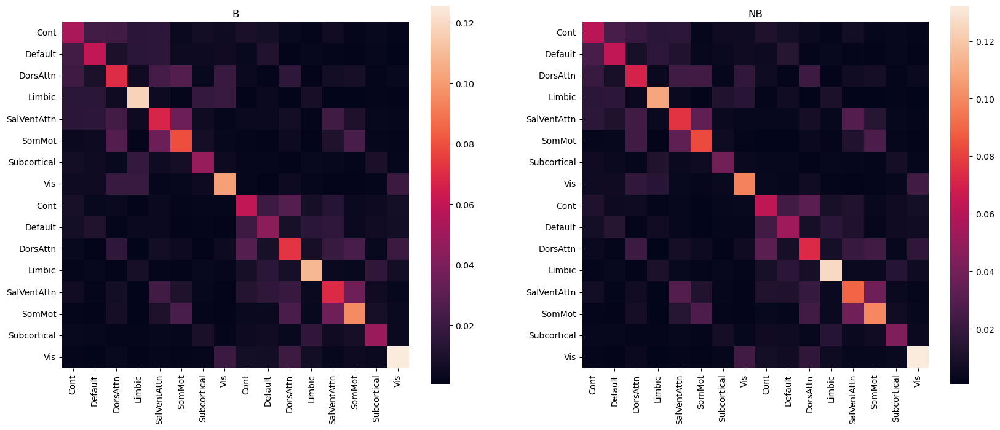

In [47]:
len_net = len(networks)
mean_GEC_all = np.empty((n_sub,2*len_net,2*len_net))
for sub in tqdm(range(n_sub)): # Loop over subjects
    GEC = GEC_sub[sub]
    mean_GEC = np.empty((2*len_net,2*len_net))
    for hemi_row_idx, hemi_row in enumerate(['RH','LH']):
        for hemi_col_idx, hemi_col in enumerate(['RH','LH']):
            mean_GEC_quad = np.empty((len_net,len_net))
            for i,network_row in enumerate(networks): # Loop over all the  networks
                for j,network_col in enumerate(networks):
                    network_idx_row = atlas_labels.loc[atlas_labels['ROI_network']==network_row]
                    network_idx_row = network_idx_row.loc[network_idx_row['Hemisphere']==hemi_row].index.values
        
                    network_idx_col = atlas_labels.loc[atlas_labels['ROI_network']==network_col]
                    network_idx_col = network_idx_col.loc[network_idx_col['Hemisphere']==hemi_col].index.values
                    
                    conn = GEC[network_idx_row,:]
                    conn = conn[:,network_idx_col]
                    mean_GEC_quad[i,j] = conn.mean()
                    # print(conn.shape)
            mean_GEC[len_net*(hemi_row_idx):len_net*(hemi_row_idx+1),len_net*(hemi_col_idx):len_net*(hemi_col_idx+1)] = mean_GEC_quad
    mean_GEC_all[sub,:,:] = mean_GEC
        
print(mean_GEC_all.shape)   

fig, axs = plt.subplots(1, 2, figsize=(20,8))
for i,group in enumerate(['B','NB']):
    group_idx = np.where(subjects_group==group)
    mats = mean_GEC_all[group_idx]
    sns.heatmap(mats.mean(axis=0), ax=axs[i], square=True,
                    xticklabels=networks.tolist()+networks.tolist(), 
                    yticklabels=networks.tolist()+networks.tolist())
    axs[i].set_title(group)

# Graph-based analyisis

## Subject-wise percolation

H001
H002
H005
H006
H008
H009
H010
R006
R011
R013
R014
R017
R018
R020
R023
R024
23M
24F
32M
41F
69M


/tmp/ipykernel_626761/699203751.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(4.5,3))


71M
73M
112SUB
164SUB
C001
C002
C003
C004
C005
C006
C007
C008


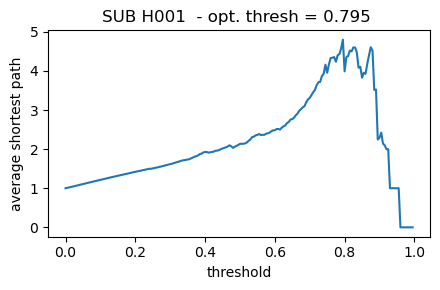

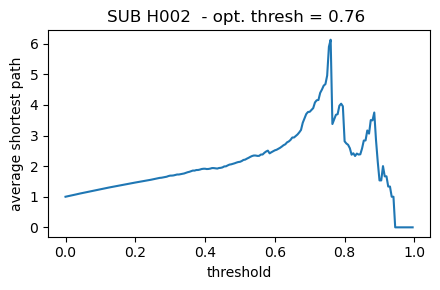

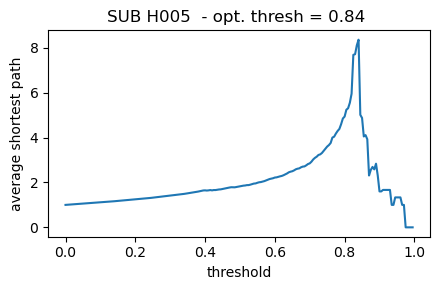

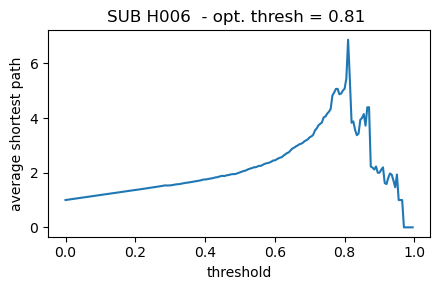

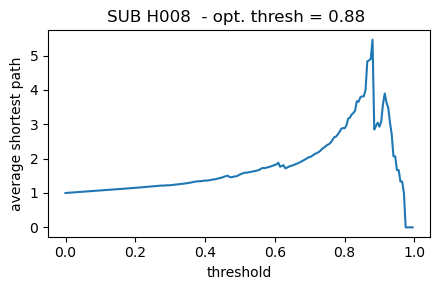

...

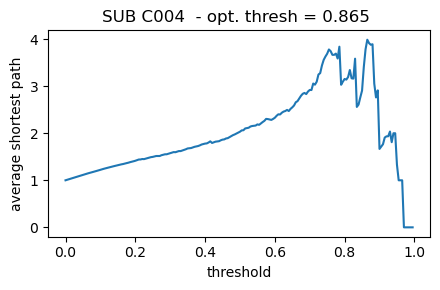

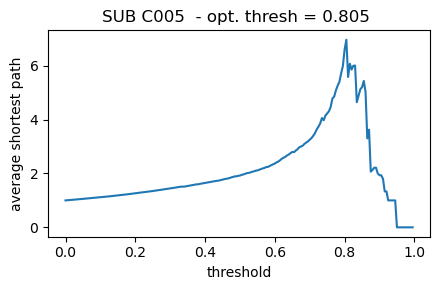

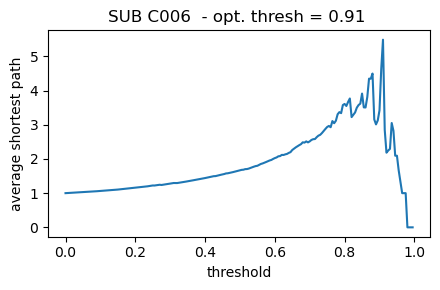

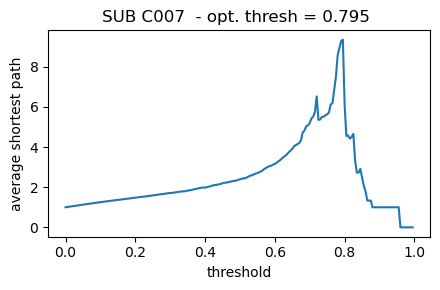

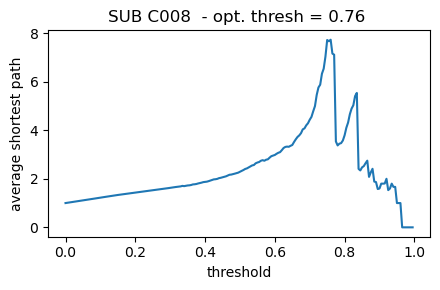

In [46]:
############################
### PERCOLATION ANALYSIS ###
############################

opt_graph_thresh_subs = []

for sub in range(n_sub): # Loop over subjects
    print(subjects_code[sub])
    fc = FC_sub[sub]

    short_path_sub = []
    n_conn_comp_sub = []

    x = np.arange(0,1,0.005) # all the possible threshold values (for the binarization)

    
    short_paths = []
    n_conn_comps = []
    for thresh in x: # Loop over the thresolds for the phase locking matrices
        # Devo thresholdare pure la matrice media
        fc_sub = np.copy(fc)
        fc_sub = np.abs(fc) # Absolutize the pl matrix
        fc_sub[np.where(fc_sub<thresh)] = 0 # Binarize the mean pl matrix according to the current thresh
        fc_sub[np.where(fc_sub>=thresh)] = 1 # Binarize the mean pl matrix according to the current thresh

        G = nx.from_numpy_array(fc_sub)
        # Which metrics I want to look at
        short_paths.append(graph_metrics('average_shortest_path', G, list(mas_list.values())))
        n_conn_comps.append(graph_metrics('number_connected_components', G, list(mas_list.values())))
    short_path_sub.append(short_paths)
    n_conn_comp_sub.append(n_conn_comps)


    # End of the loop over states of the current subject #
    #######################################
    ### PLOTS and find the opt TRESHOLD ###
    #######################################
    
    opt_thresh = x[np.argmax(short_path_sub)]
    opt_graph_thresh_subs.append(opt_thresh)  
    fig = plt.figure(figsize=(4.5,3))
    plt.title('SUB '+subjects_code[sub]+'  - opt. thresh = {} '.format(round(opt_thresh, 4)), fontsize=12)
    plt.plot(x, short_path_sub[0])
    plt.xlabel('threshold')
    plt.ylabel('average shortest path')
    fig.tight_layout()
    # plt.savefig('output/MD_05122023/K'+str(K)+'/Percolation_ShortestPath_sub'+subjects_code[sub]+'_K'+str(K)+'_state'+str(s+1)+'.png',
    #             dpi=200)
                
with open('output_global/opt_graph_thresh.pickle', 'wb') as handle:
    pickle.dump(opt_graph_thresh_subs, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [47]:
with open('output_global/opt_graph_thresh.pickle', 'wb') as handle:
    pickle.dump(opt_graph_thresh_subs, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [48]:
40*16


640

In [49]:
3000/62

48.38709677419355

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 3.33e-03 < p <= 1.67e-02
      **: 3.33e-04 < p <= 3.33e-03
     ***: 3.33e-05 < p <= 3.33e-04
    ****: p <= 3.33e-05

C vs. B: Brunner-Munzel test, P_val:5.355e-02 W=-2.036e+00
B vs. NB: Brunner-Munzel test, P_val:9.693e-04 W=4.243e+00
C vs. NB: Brunner-Munzel test, P_val:1.751e-01 W=1.405e+00
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 3.33e-03 < p <= 1.67e-02
      **: 3.33e-04 < p <= 3.33e-03
     ***: 3.33e-05 < p <= 3.33e-04
    ****: p <= 3.33e-05

C vs. B: Brunner-Munzel test, P_val:5.637e-01 W=5.865e-01
B vs. NB: Brunner-Munzel test, P_val:2.443e-02 W=-2.594e+00
C vs. NB: Brunner-Munzel test, P_val:1.728e-01 W=-1.409e+00
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 3.33e-03 < p <= 1.67e-02
      **: 3.33e-04 < p <= 3.33e-03
     ***: 3.33e-05 < p <= 3.33e-04
    ****: p <= 3.33e-05

C vs. B: Brunner-Munzel test, P_val:6.652e-01 W=-4.405e-01
B vs. NB: Brunner-Munzel test, P_val:1.357e

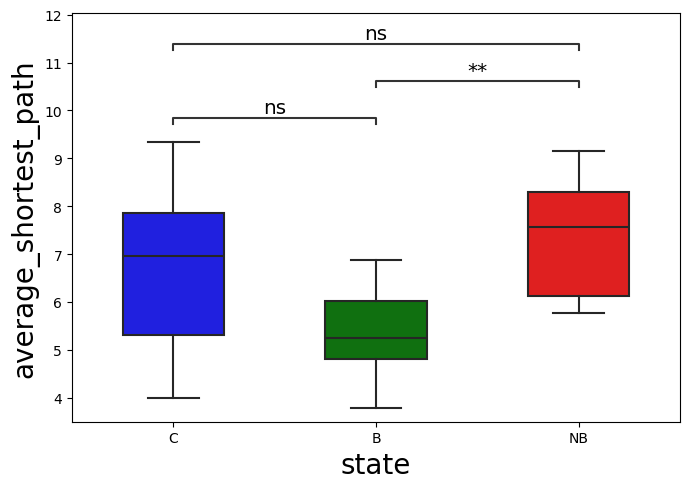

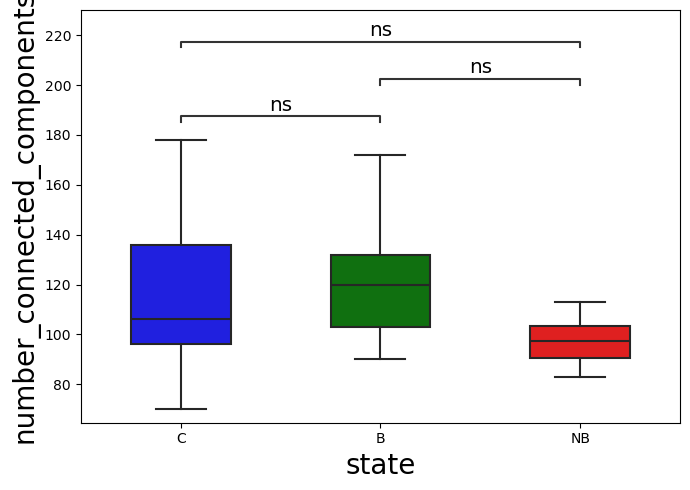

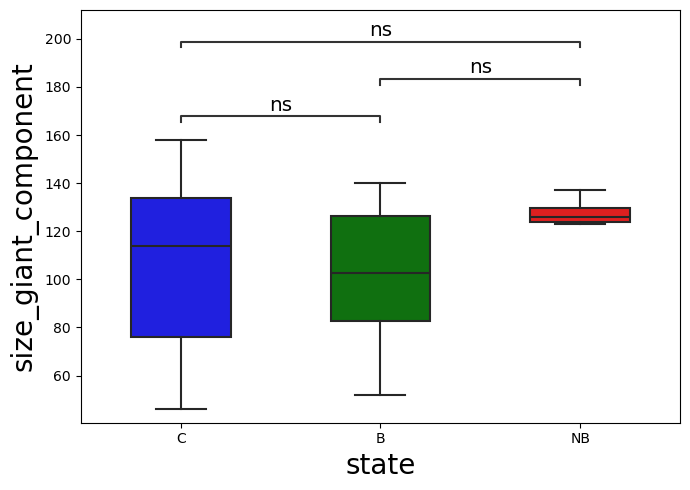

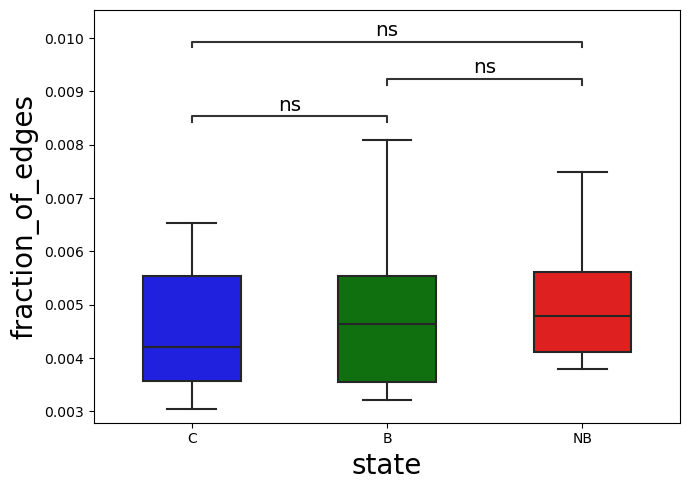

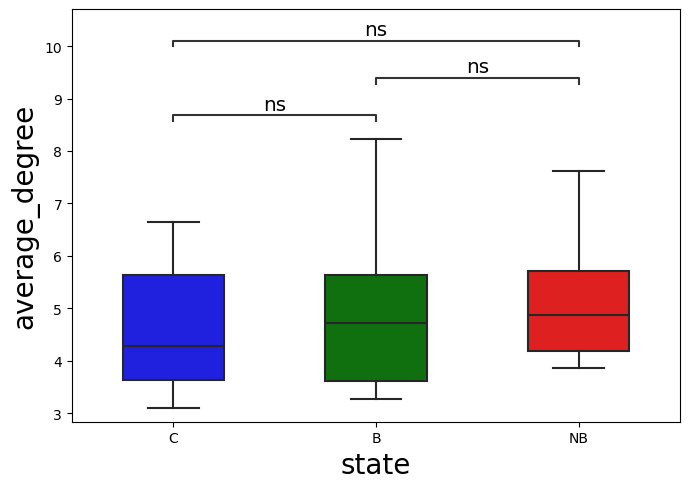

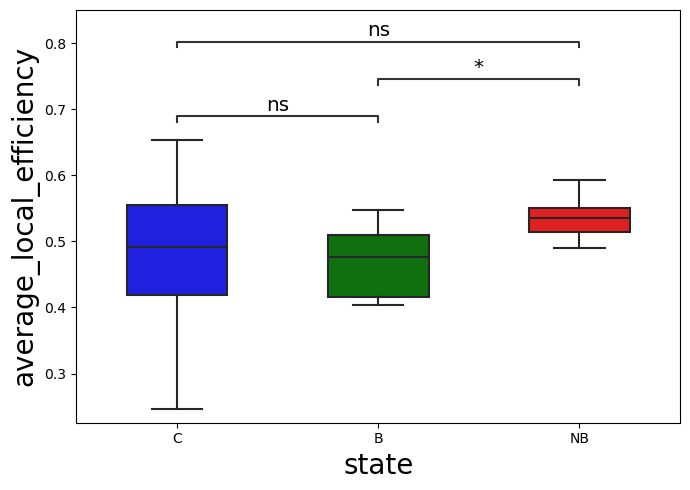

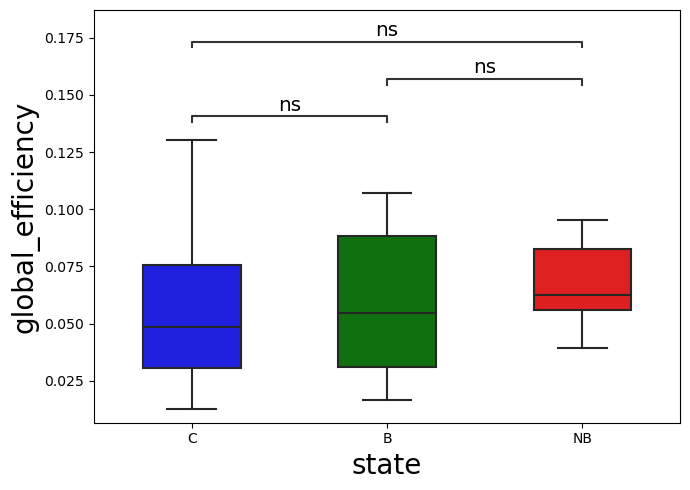

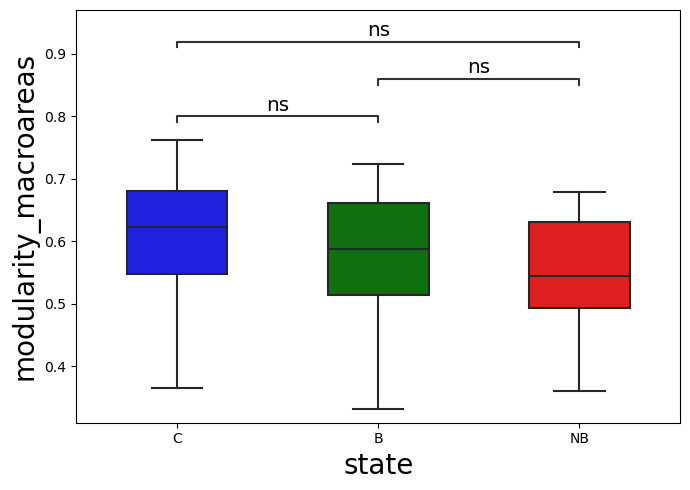

In [57]:
# GLOBAL METRICS


# Once I compute the optimal threshold I can compare metrics between groups
metriche = ['average_shortest_path','number_connected_components','size_giant_component',
            'fraction_of_edges','average_degree',
            'average_local_efficiency', 'global_efficiency', 'modularity_macroareas']



for metrica in metriche:
    mmm = [] # subject-state-wise measures of the current metric
    ggg = [] # group of each subject
    conf_dic = {}
    df_metrics = [] # List which contains dataframe for each state
    metrics = [] # metrics for each state
    for sub in range(n_sub): # Loop over subjects
        fc = FC_sub[sub]
        sub_group = subjects_group[sub]
        thresh = opt_graph_thresh_subs[sub]

        # I have to evaluate the metrics for the three groups
        # Devo thresholdare pure la matrice media
        fc_sub = np.copy(fc)
        fc_sub = np.abs(fc_sub) # Absolutize 
        fc_sub[np.where(fc_sub<thresh)] = 0 # Binarize the mean pl matrix according to the current thresh
        fc_sub[np.where(fc_sub>thresh)] = 1 # Binarize the mean pl matrix according to the current thresh
        G = nx.from_numpy_array(fc_sub)
        measure = graph_metrics(metrica, G, list(mas_list.values()))

        mmm.append(measure)
        ggg.append(sub_group)
    
    df_metrics = pd.DataFrame(data = {metrica: mmm, 'groups': ggg})

    ############
    ### PLOT ###
    ############
    groups_order = ['C', 'B', 'NB']
    pairs = [['C','B'],['C','NB'],['B','NB']]
    my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
    annot_test =  'Brunner-Munzel'
    # annot_test = 't-test_ind'

    hue_plot_params = {
        'data': df_metrics,
        'x': 'groups',
        'y': metrica,
        "order": ['C','B','NB'],
        "palette": my_pal
    }
    
    fig,ax = plt.subplots(1,1, figsize=(7,5))
    with sns.plotting_context("notebook", font_scale = 1.2):
        # Create new plot
    #     ax = get_log_ax()

        # Plot with seaborn
        sns.boxplot(ax=ax, **hue_plot_params,
                         showfliers=False,
                         width=0.5)
        ax.set_xlabel('state',fontsize=20)
        ax.set_ylabel(metrica, fontsize=20)

        # Add annotations
        # Cohen's D calculation
        annotator = Annotator(ax, pairs, **hue_plot_params)
        annotator.configure(test=annot_test, text_format='star', loc='inside')
                            # ,comparisons_correction='Benjamini-Hochberg')
        annotator._pvalue_format.pvalue_thresholds =  [[0.0001/3, '****'], [0.001/3, '***'], [0.01/3, '**'], [0.05/3, '*'], [1, 'ns']]
        _, stat = annotator.apply_and_annotate()
#         annamobbene = annotator.configure(test=annot_test).apply_and_annotate()

        # Label and show
        # plt.legend(loc='lower right', fontsize=10, bbox_to_anchor=(1.2,0))
    plt.tight_layout()

    # plt.savefig('output/MD_05122023/K'+str(K)+'/NO_PL_thresh/GMETRICS_'+metrica+'_npick'+str(n_pick)+'_nsamp75minclust_K'+str(K)+'_no_annot.png',
    #             dpi=200)


# GEC metrics: Trophic coherence, Imbalance, Hierarchy Level, Irreversibility

## Global-level

In [47]:
# count how many node for each network

def count_node_per_net(node_list, network_list, atlas_lab, net_or_state='ROI_network'):
    net_dic = {}
    # Initialize the dicionary with the count of the node for each network
    for net in network_list:
        net_dic[net] = 0
    for node in node_list: # Loop over nodes
        curr_net = atlas_lab.iloc[node][net_or_state]
        net_dic[curr_net] +=1
    return net_dic

In [48]:
GEC_metrics = scipy.io.loadmat('../data/EffectiveConnectivity/EC_global_metrics/GEC_metrics.mat')

In [49]:
keys = ['hierarchicallevels', 'imbalance', 'trophiccoherence']
hierarchicallevels = GEC_metrics[keys[0]]
imbalance = GEC_metrics[keys[1]]
trophiccoherence = GEC_metrics[keys[2]][0]

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: Brunner-Munzel test, P_val:9.176e-01 W=-1.059e-01
B vs. NB: Brunner-Munzel test, P_val:6.330e-01 W=4.883e-01
C vs. NB: Brunner-Munzel test, P_val:5.806e-01 W=5.689e-01


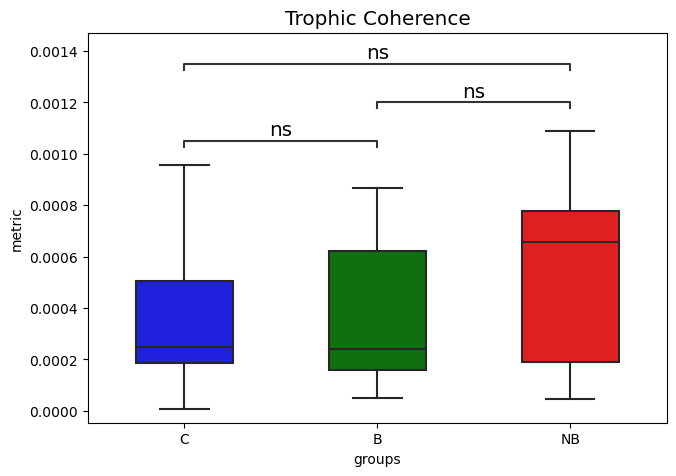

In [53]:
# Trophic Choerence
annot_test =  'Brunner-Munzel'
pairs = [('C','B'),('C','NB'),('B','NB')]


mmm = []
groupz = []
for i,group in enumerate(subjects_group):
    mmm.append(trophiccoherence[i])
    groupz.append(group)

df = pd.DataFrame({'metric':mmm, 'groups':groupz})
hue_plot_params = {
    'data': df,
    'x': 'groups',
    'y': 'metric',
    "order": ['C','B','NB'],
    "palette": my_pal
}
fig,ax = plt.subplots(1,1, figsize=(7,5))
with sns.plotting_context("notebook", font_scale = 1.2):
    sns.boxplot(**hue_plot_params, showfliers=False, width=0.5, ax=ax)
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test=annot_test, text_format='star', loc='inside')
                        # ,comparisons_correction='Benjamini-Hochberg')
    _, stat = annotator.apply_and_annotate()
    plt.title('Trophic Coherence')
    plt.tight_layout()

# plt.savefig('output_global_Malta//TrophicCoherence.png', dpi=200)

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: Brunner-Munzel test, P_val:3.837e-01 W=8.887e-01
B vs. NB: Brunner-Munzel test, P_val:1.288e-01 W=-1.717e+00
C vs. NB: Brunner-Munzel test, P_val:8.224e-01 W=-2.278e-01


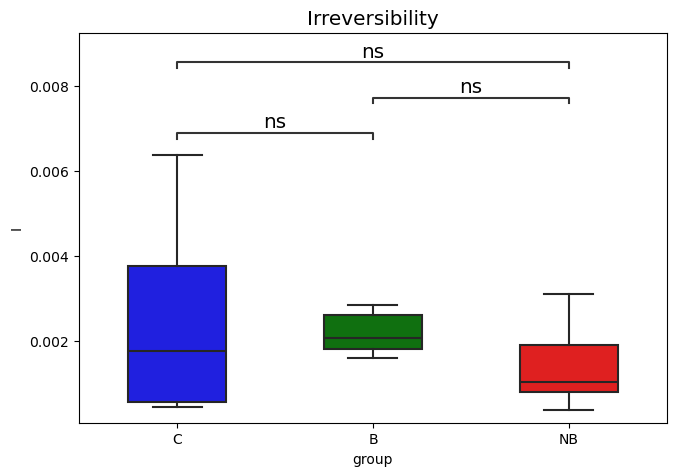

In [54]:
df = pd.DataFrame({'I':I_global[:,0], 'group':subjects_group})
my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
annot_test =  'Brunner-Munzel'
# annot_test = 't-test_ind'
pairs = [('C','B'),('C','NB'),('B','NB')]

hue_plot_params = {
    'data': df,
    'x': 'group',
    'y': 'I',
    "order": ['C','B','NB'],
    "palette": my_pal
}
fig,ax = plt.subplots(1,1, figsize=(7,5))
with sns.plotting_context("notebook", font_scale = 1.2):
    sns.boxplot(**hue_plot_params, showfliers=False, width=0.5, ax=ax)
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test=annot_test, text_format='star', loc='inside')
                        # ,comparisons_correction='Benjamini-Hochberg')
    _, stat = annotator.apply_and_annotate()
    plt.title('Irreversibility')
    plt.tight_layout()

# plt.savefig('output_global_Malta/Global_Irreversibility.png', dpi=200)

(17, 236) (8, 236) (8, 236)
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: t-test independent samples, P_val:4.060e-04 t=-3.827e+00
B vs. NB: t-test independent samples, P_val:5.669e-07 t=-5.847e+00
C vs. NB: t-test independent samples, P_val:9.212e-10 t=-7.751e+00
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: t-test independent samples, P_val:9.891e-06 t=4.992e+00
B vs. NB: t-test independent samples, P_val:6.464e-02 t=-1.895e+00
C vs. NB: t-test independent samples, P_val:9.167e-04 t=3.555e+00
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: t-test independent sam

/tmp/ipykernel_159244/2812537882.py:255: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax = plt.subplots(1,1, figsize=(7,5))


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: t-test independent samples, P_val:8.564e-01 t=-1.830e-01
B vs. NB: t-test independent samples, P_val:3.577e-01 t=9.511e-01
C vs. NB: t-test independent samples, P_val:5.173e-01 t=6.576e-01


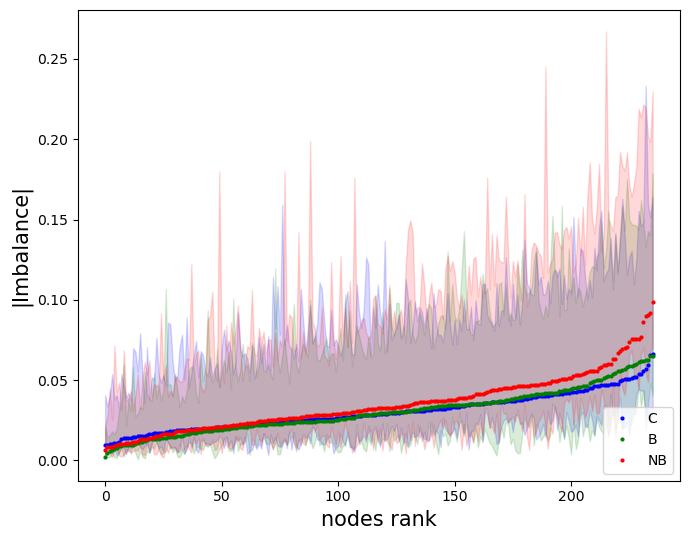

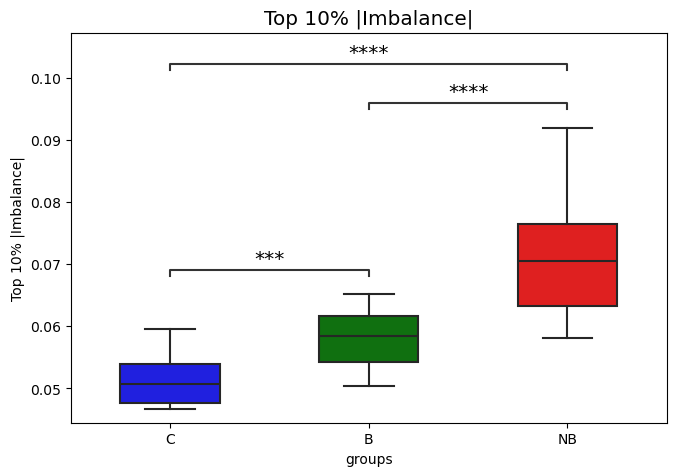

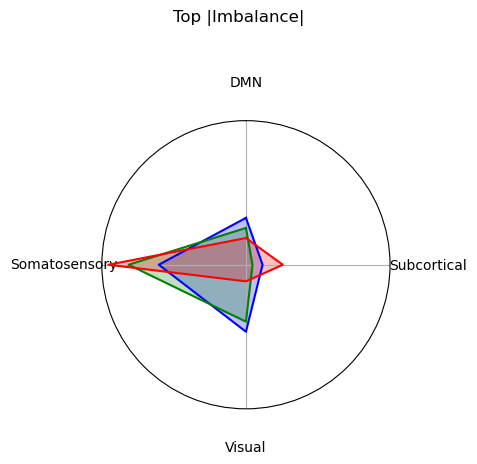

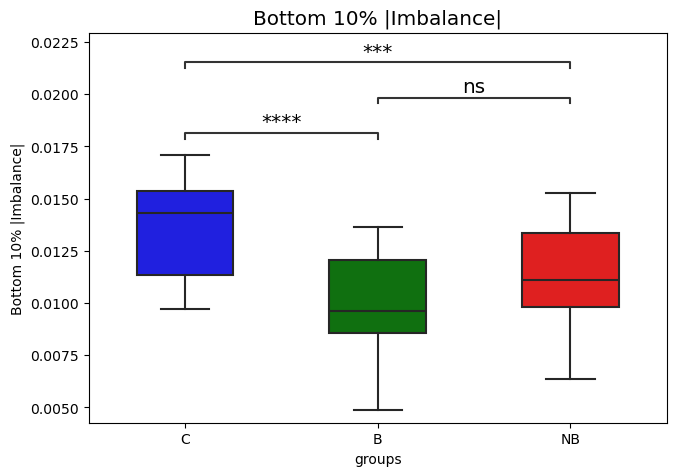

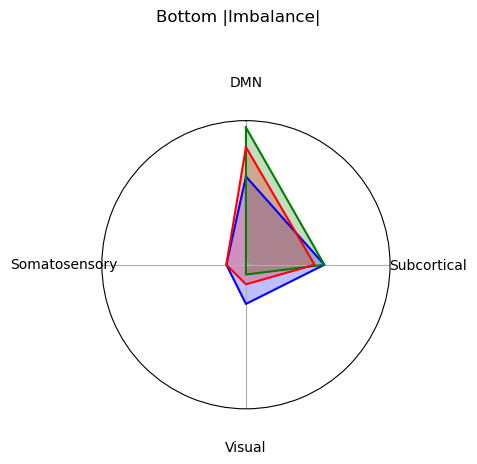

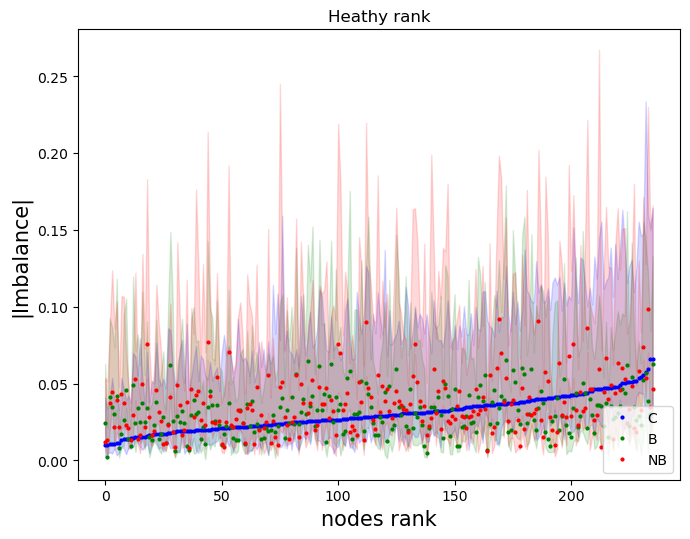

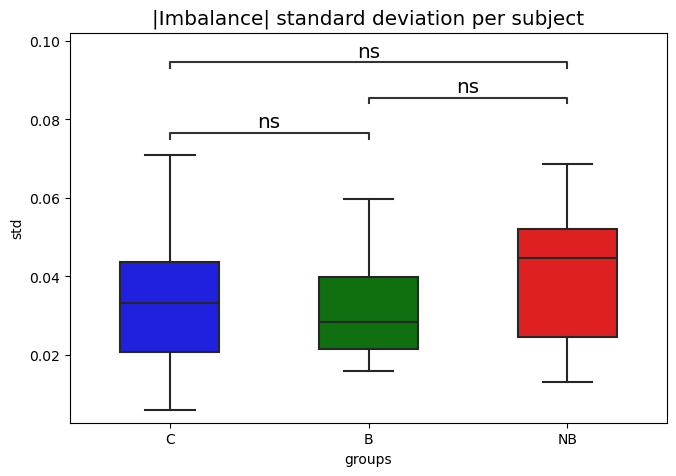

In [ ]:
net_or_state = 'ROI_state'
if net_or_state=='ROI_network':
    network_per_area = atlas_labels['ROI_network'].values
    nets=networks
else:
    network_per_area = atlas_labels['ROI_state'].values
    nets = ['DMN', 'Somatosensory','Visual','Subcortical']

    

measure_name = ['|Imbalance|','Hierarchical levels', 'Irreversibility']
network_per_area = atlas_labels['ROI_network'].values
measures = [imbalance, hierarchicallevels, I_per_area]

plot_1 = False
plot_2 = True
plot_3 = True

n = 10
top_tail = int(236/100*n)
my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
groups_order = ['C','B','NB']
annot_test =  'Brunner-Munzel'
annot_test =  't-test_ind'
annot__test = 'Wilcoxon'


for m_i, measure_n in enumerate(measure_name):
    measure = measures[m_i]
    ###########################################################################
    ## Ordering all the areas per subject, then averaging following the rank ##
    ###########################################################################
    if plot_1:
        measures_per_group = [[],[],[]]
        mes_C = np.empty((0,236))
        mes_B = np.empty((0,236))
        mes_NB = np.empty((0,236))
        for i,group in enumerate(subjects_group):
            mes = np.copy(measure[i])
            if m_i==0:
                mes = np.abs(mes)
            mes = np.sort(mes)
            if group=='C':
                mes_C = np.concatenate((mes_C, mes[np.newaxis,:]), axis=0)
            elif group=='B':
                mes_B = np.concatenate((mes_B, mes[np.newaxis,:]), axis=0)
            elif group=='NB':
                mes_NB = np.concatenate((mes_NB, mes[np.newaxis,:]), axis=0)
        print(mes_C.shape, mes_B.shape, mes_NB.shape)    
        measures_per_group = [mes_C,mes_B,mes_NB]
        
        fig,ax = plt.subplots(1,1, figsize=(7, 5.5))
        labels = ['C','B','NB']
        colors = ['blue','green','red']
        cmaps = ['RdBu','PiYG','bwr']
        for g in range(3):
            mes = measures_per_group[g]
            m = np.median(mes, axis=0)
            m_perc_25 = np.percentile(mes, 25, axis=0)
            m_perc_75 = np.percentile(mes, 75, axis=0)
            m_std = np.std(m, axis=0)
            
            ax.plot(range(m.shape[0]), m, 'o', label=labels[g], color=colors[g], markersize=2)
            # ax.errorbar(range(m.shape[0]), m, yerr=m_std, label=labels[g], color=colors[g])
        
            plt.fill_between(range(m.shape[0]), m-m_perc_25, m+m_perc_75, color=colors[g], alpha=0.15)
            ax.set_ylabel(measure_n, fontsize=15)
            ax.set_xlabel('nodes rank', fontsize=15)
        
        ax.legend(loc='lower right')
        fig.tight_layout()
        
        # plt.savefig('output_global/'+measure_n'.png', dpi=200)
    
    ##########################################################
    ## Averaging the values among subjects and then sorting ##
    ##########################################################
    
    if plot_2:
        mes_C = np.empty((0,236))
        mes_B = np.empty((0,236))
        mes_NB = np.empty((0,236))
        for i,group in enumerate(subjects_group):
            mes = np.copy(measure[i])
            if m_i==0:
                mes = np.abs(mes)
            mes = np.abs(mes)

            if group=='C':
                mes_C = np.concatenate((mes_C, mes[np.newaxis,:]), axis=0)
            elif group=='B':
                mes_B = np.concatenate((mes_B, mes[np.newaxis,:]), axis=0)
            elif group=='NB':
                mes_NB = np.concatenate((mes_NB, mes[np.newaxis,:]), axis=0)
        print(mes_C.shape, mes_B.shape, mes_NB.shape)    
        mean_mes_C = np.median(mes_C, axis=0)
        perc_mes_C = [np.percentile(mes_C, 25, axis=0), np.percentile(mes_C, 75, axis=0)]
        mean_mes_B = np.median(mes_B, axis=0)
        perc_mes_B = [np.percentile(mes_B, 25, axis=0), np.percentile(mes_B, 75, axis=0)]
        mean_mes_NB = np.median(mes_NB, axis=0)
        perc_mes_NB = [np.percentile(mes_NB, 25, axis=0), np.percentile(mes_NB, 75, axis=0)]
    
        mes_per_group = [mes_C, mes_B, mes_NB]
        measure_per_group = [mean_mes_C, mean_mes_B, mean_mes_NB]
        perc_per_group = [perc_mes_C, perc_mes_B, perc_mes_NB]
        
        fig,ax = plt.subplots(1,1, figsize=(7, 5.5))
        labels = ['C','B','NB']
        colors = ['blue','green','red']
        cmaps = ['RdBu','PiYG','bwr']
        m_top = [] # Top 10% of areas for each group
        m_top_arg = []
        m_bottom = [] # Bottom 10% of areas for each group
        m_bottom_arg = []
        for g in range(3):
            mes = measure_per_group[g]
            perc = perc_per_group[g]
            rank = np.argsort(mes)
            # Save the healthy rank
            if g==0:
                h_rank=rank
            m = mes[rank]
            ax.plot(range(m.shape[0]), m, 'o', label=labels[g], color=colors[g], markersize=2)
        
            plt.fill_between(range(m.shape[0]), m-perc[0][rank], m+perc[1][rank], color=colors[g], alpha=0.15)
            ax.set_ylabel(measure_n, fontsize=15)
            ax.set_xlabel('nodes rank', fontsize=15)
    
            # TOP 10%
            m_top += m[-top_tail:].tolist()
            m_top_arg.append(rank[-top_tail:])
            # BOTTOM 10%
            m_bottom += m[:top_tail].tolist()
            m_bottom_arg.append(rank[:top_tail])
            
        ax.legend(loc='lower right')
        fig.tight_layout()
        # plt.savefig('output_global_Malta/'+measure_n+'.png', dpi=200)
    
        # Plot top 10%
        pairs = [('C','B'),('C','NB'),('B','NB')]
        df = pd.DataFrame({'Top 10% '+measure_n :m_top, 'groups':['C']*top_tail+['B']*top_tail+['NB']*top_tail})
        hue_plot_params = {
            'data': df,
            'x': 'groups',
            'y': 'Top 10% '+measure_n,
            "order": ['C','B','NB'],
            "palette": my_pal
        }
        fig,ax = plt.subplots(1,1, figsize=(7,5))
        with sns.plotting_context("notebook", font_scale = 1.2):
            sns.boxplot(**hue_plot_params, showfliers=False, width=0.5, ax=ax)
            annotator = Annotator(ax, pairs, **hue_plot_params)
            annotator.configure(test=annot_test, text_format='star', loc='inside')
                                # ,comparisons_correction='Benjamini-Hochberg')
            _, stat = annotator.apply_and_annotate()
            plt.title('Top 10% '+measure_n)
            plt.tight_layout()
        # plt.savefig('output_global_Malta/'+measure_n+'_top'+str(n)+'_distr.png', dpi=200)
    
        ## Who is the top 10%
        # RADAR
        count_for_radar = []
        for g in range(3): 
            countz = count_node_per_net(m_top_arg[g], nets, atlas_labels, net_or_state=net_or_state)
            coun = [v for v in countz.values()]
            count_for_radar.append(coun)
            
        fig = make_radar(nets, count_for_radar, groups_order, 'Top '+measure_n)
        if state_or_net=='net':
            plt.savefig('output_global_Malta/'+measure_name[m_i]+'_top'+str(n)+'_radar.png', dpi=200)
        else:
            plt.savefig('output_global_Malta_states/'+measure_name[m_i]+'_top'+str(n)+'_radar.png', dpi=200)


        # Plot bottom 10%
        pairs = [('C','B'),('C','NB'),('B','NB')]
        df = pd.DataFrame({'Bottom 10% '+measure_n :m_bottom, 'groups':['C']*top_tail+['B']*top_tail+['NB']*top_tail})
        hue_plot_params = {
            'data': df,
            'x': 'groups',
            'y': 'Bottom 10% '+measure_n,
            "order": ['C','B','NB'],
            "palette": my_pal
        }
        fig,ax = plt.subplots(1,1, figsize=(7,5))
        with sns.plotting_context("notebook", font_scale = 1.2):
            sns.boxplot(**hue_plot_params, showfliers=False, width=0.5, ax=ax)
            annotator = Annotator(ax, pairs, **hue_plot_params)
            annotator.configure(test=annot_test, text_format='star', loc='inside')
                                # ,comparisons_correction='Benjamini-Hochberg')
            _, stat = annotator.apply_and_annotate()
            plt.title('Bottom 10% '+measure_n)
            plt.tight_layout()
        if state_or_net=='net':
            plt.savefig('output_global_Malta/'+measure_n+'_bottom'+str(n)+'_distr.png', dpi=200)
        else:
            plt.savefig('output_global_Malta_states/'+measure_n+'_bottom'+str(n)+'_distr.png', dpi=200)

    
        ## Who is the bottom 10%
        # RADAR
        count_for_radar = []
        for g in range(3): 
            countz = count_node_per_net(m_bottom_arg[g], nets, atlas_labels, net_or_state=net_or_state)
            coun = [v for v in countz.values()]
            count_for_radar.append(coun)
            
        fig = make_radar(nets, count_for_radar, groups_order, 'Bottom '+measure_n)
        if state_or_net=='net':
            plt.savefig('output_global_Malta/'+measure_name[m_i]+'_bottom'+str(n)+'_radar.png', dpi=200)
        else:
            plt.savefig('output_global_Malta_states/'+measure_name[m_i]+'_bottom'+str(n)+'_radar.png', dpi=200)
    
        ## PLot curves according to the healthy rank ##
        fig,ax = plt.subplots(1,1, figsize=(7, 5.5))
        for g in range(3):
            mes = measure_per_group[g]
            perc = perc_per_group[g]
            m = mes[h_rank]
            ax.plot(range(m.shape[0]), m, 'o', label=labels[g], color=colors[g], markersize=2)
        
            plt.fill_between(range(m.shape[0]), m-perc[0][h_rank], m+perc[1][h_rank], color=colors[g], alpha=0.15)
            plt.title('Heathy rank')
            ax.set_ylabel(measure_n, fontsize=15)
            ax.set_xlabel('nodes rank', fontsize=15)
    
        ax.legend(loc='lower right')
        fig.tight_layout()
        plt.savefig('output_global_Malta/'+measure_n+'_healthy_order.png', dpi=200)
        
        
    ###########################################
    ## Compare standard deviation per groups ##
    ###########################################
    
    if plot_3:
        stds = [mes_per_group[i].std(axis=1) for i in range(3)]
        stds_l = []
        groupz = []
        for i,std in enumerate(stds):
            stds_l += std.tolist()
            groupz += [groups_order[i]]*len(std)
            
        pairs = [('C','B'),('C','NB'),('B','NB')]
        
        df = pd.DataFrame({'std':stds_l, 'groups':groupz})
        hue_plot_params = {
            'data': df,
            'x': 'groups',
            'y': 'std',
            "order": ['C','B','NB'],
            "palette": my_pal
        }
        fig,ax = plt.subplots(1,1, figsize=(7,5))
        with sns.plotting_context("notebook", font_scale = 1.2):
            sns.boxplot(**hue_plot_params, showfliers=False, width=0.5, ax=ax)
            annotator = Annotator(ax, pairs, **hue_plot_params)
            annotator.configure(test=annot_test, text_format='star', loc='inside')
                                # ,comparisons_correction='Benjamini-Hochberg')
            _, stat = annotator.apply_and_annotate()
            plt.title(measure_n+' standard deviation per subject')
            plt.tight_layout()
        # plt.savefig('output_global_Malta/StD_'+measure_n+'.png', dpi=200)

In [145]:
# Correlation between 10% per subjcect of irreversibility and hierarchy levels
hl = np.copy(hierarchicallevels)
np.median(hl,axis=0).shape
# I_per_area

(236,)

In [ ]:
# barplot with a value for each area, grouped by network, three groups overlapped

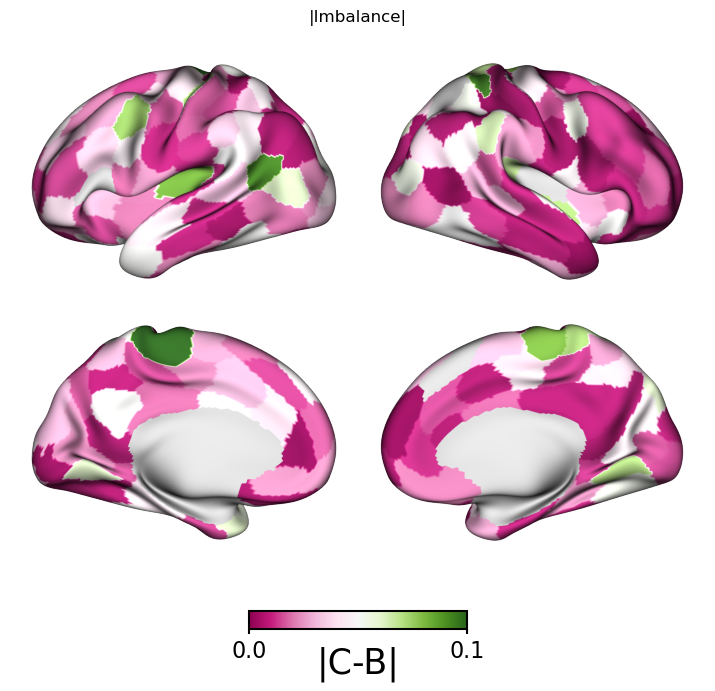

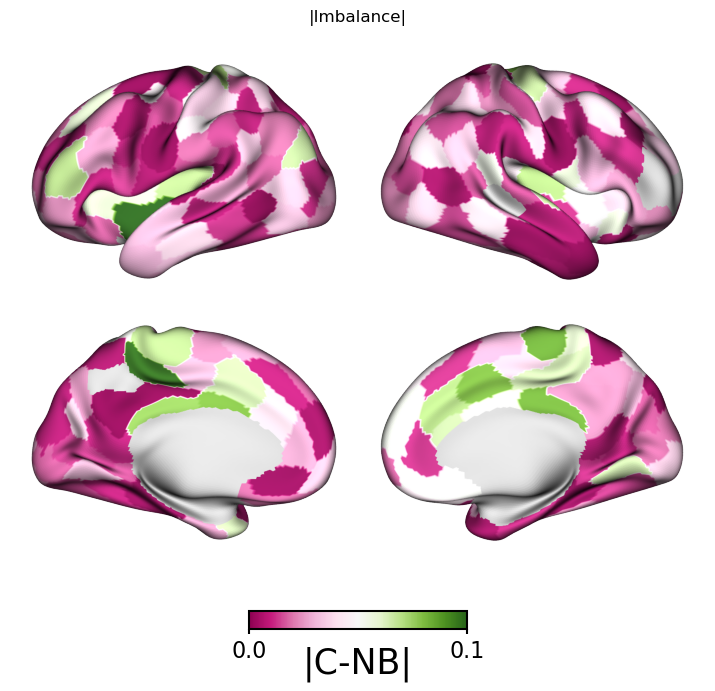

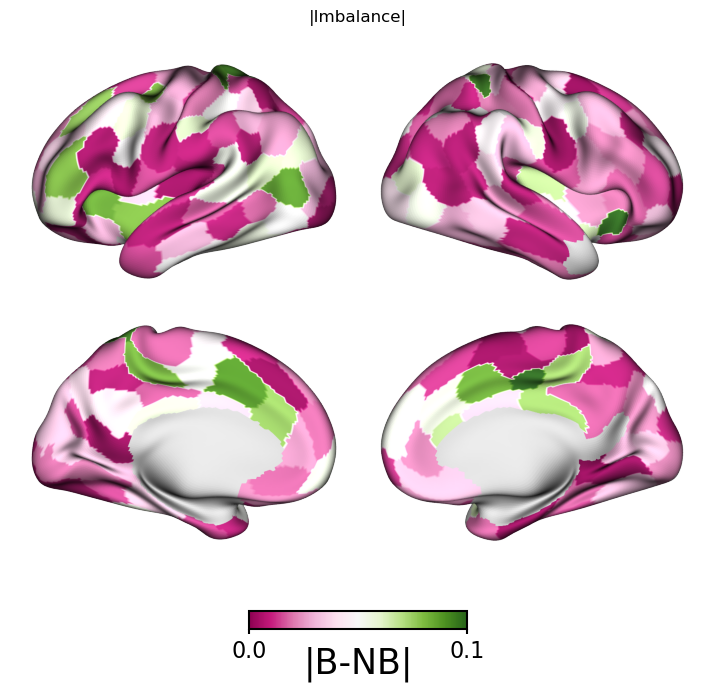

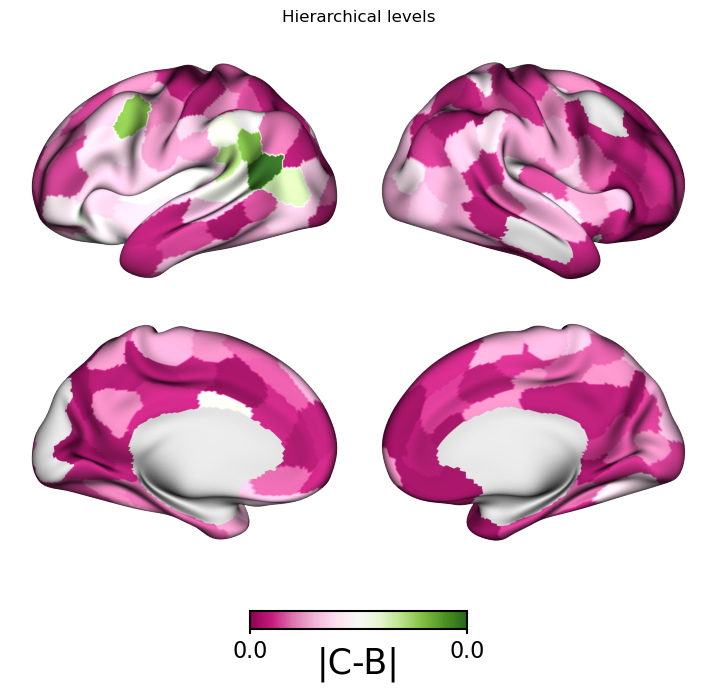

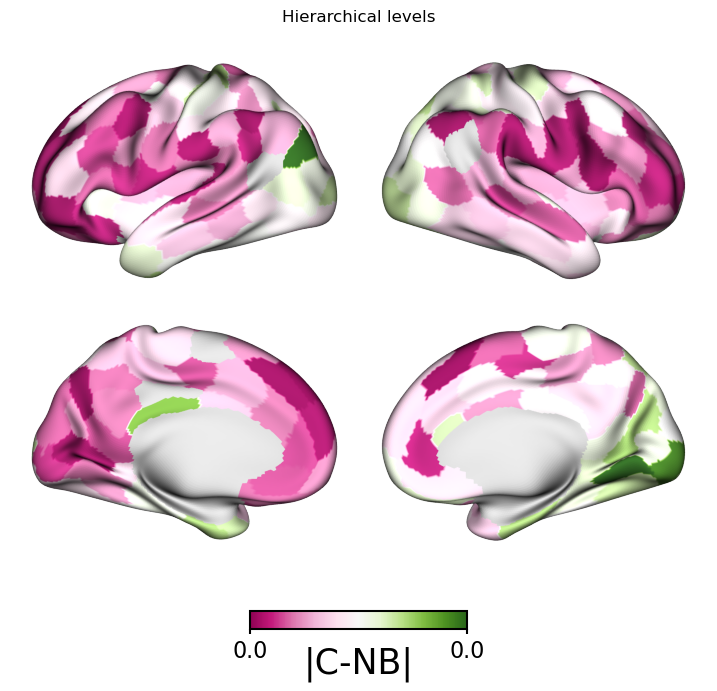

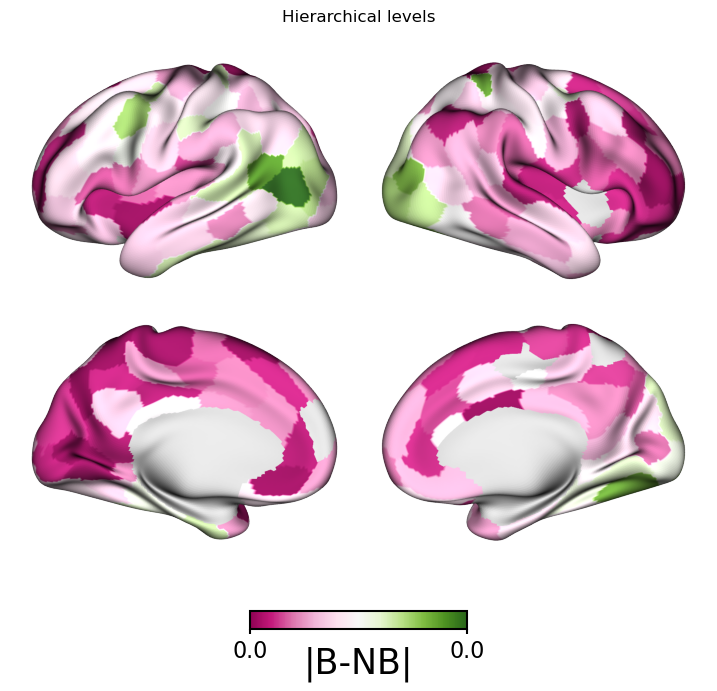

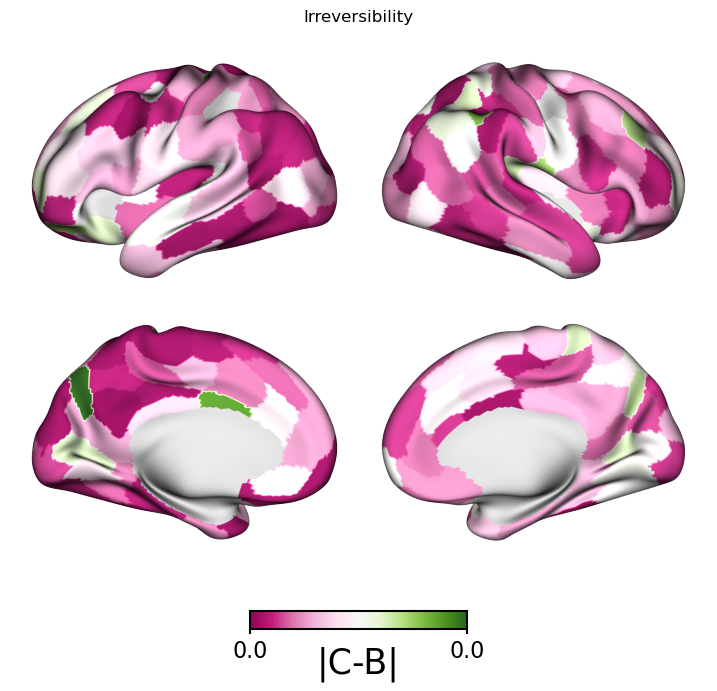

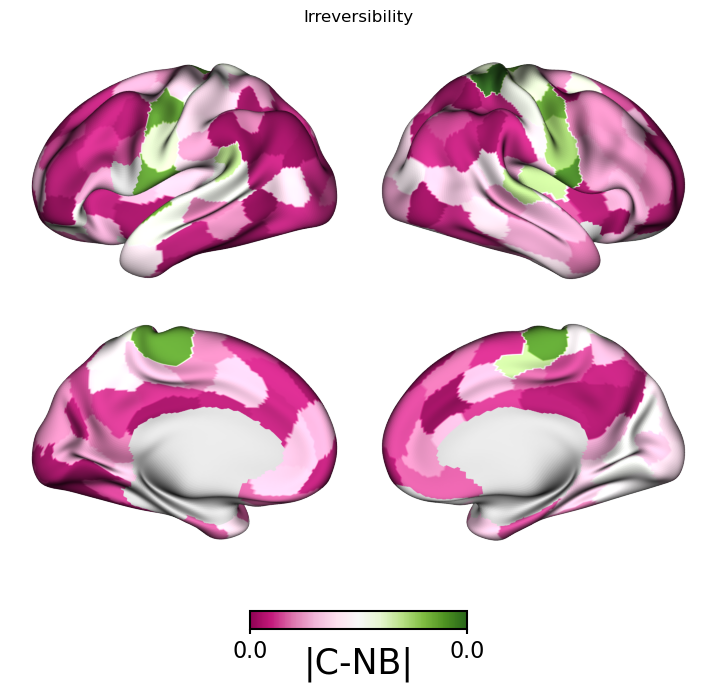

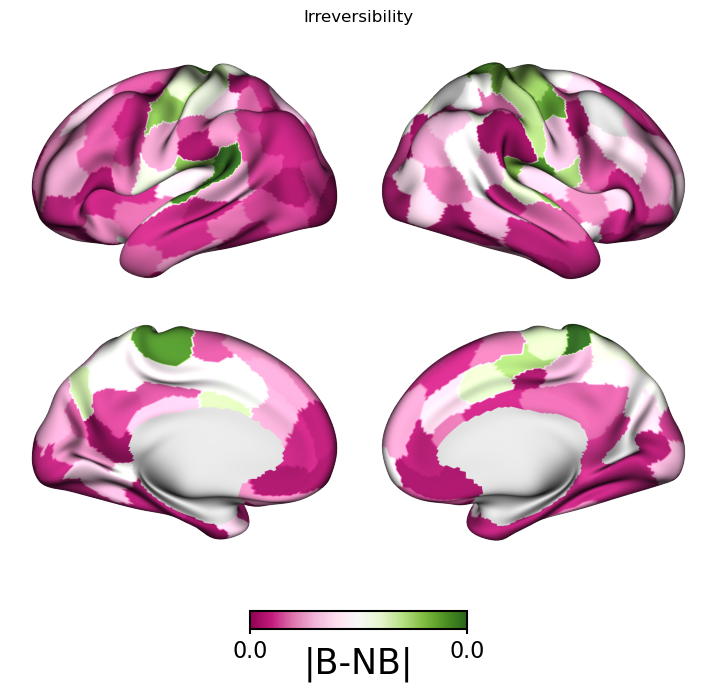

In [60]:
#######################################################################
## Where are the differences? Differences in hl and imb among groups ##
#######################################################################
cmap_ ='PiYG'
# cmap_ ='coolwarm'
# A brain for each group, then a subtract the brains

measure_name = ['|Imbalance|','Hierarchical levels', 'Irreversibility']
network_per_area = atlas_labels['ROI_network'].values
measures = [imbalance, hierarchicallevels, I_per_area]


for m_i, measure_n in enumerate(measure_name):
    brains = []
    measure = measures[m_i]
    for g in groups_order:
        brains.append(np.mean(measure[np.where(subjects_group==g)], axis=0))
    # Let's compute the differences
    # |C-B|
    diff = np.abs(brains[0]-brains[1])
    fig=normal_view(diff[:200], parcellation_name='schaefer', parcellation=200, surftype='inflated', cmap=cmap_,
                q_thresh=0.02, center_cbar=False, exp_form=False, xlabel='|C-B|' )
    fig.suptitle(measure_n)
    plt.tight_layout()
    # plt.savefig('output/AB_15052024_noclustfilt/K'+str(K)+'/centroids_brains_K'+str(K)+'_state'+str(i+1)+'.svg',
    #     dpi=200)
    # |C-NB|
    diff = np.abs(brains[0]-brains[2])
    fig=normal_view(diff[:200], parcellation_name='schaefer', parcellation=200, surftype='inflated', cmap=cmap_,
                q_thresh=0.02, center_cbar=False, exp_form=False, xlabel='|C-NB|' )
    fig.suptitle(measure_n)
    plt.tight_layout()
    # plt.savefig('output/AB_15052024_noclustfilt/K'+str(K)+'/centroids_brains_K'+str(K)+'_state'+str(i+1)+'.svg',
    #     dpi=200)
    # |B-NB|
    diff = np.abs(brains[1]-brains[2])
    fig=normal_view(diff[:200], parcellation_name='schaefer', parcellation=200, surftype='inflated', cmap=cmap_,
                q_thresh=0.02, center_cbar=False, exp_form=False, xlabel='|B-NB|' )
    fig.suptitle(measure_n)
    plt.tight_layout()
    # plt.savefig('output/AB_15052024_noclustfilt/K'+str(K)+'/centroids_brains_K'+str(K)+'_state'+str(i+1)+'.svg',
    #     dpi=200)

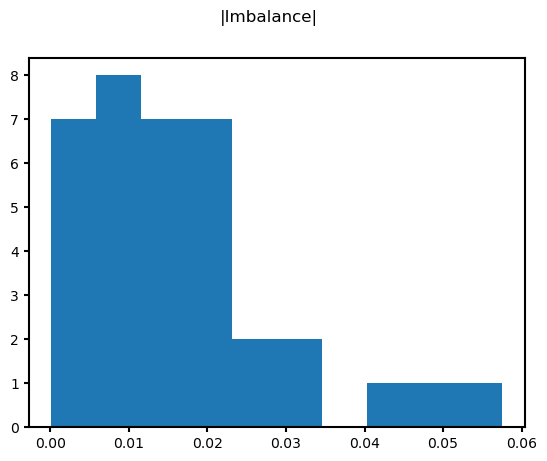

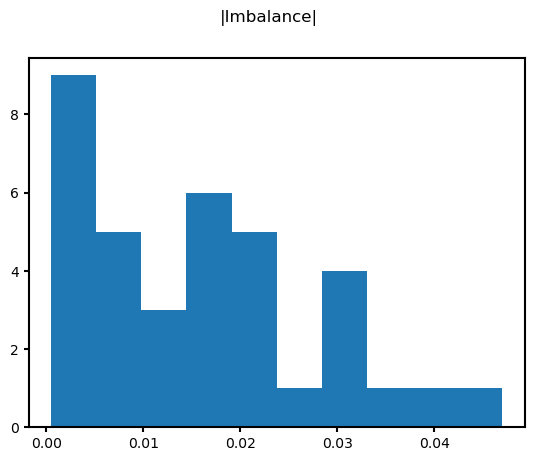

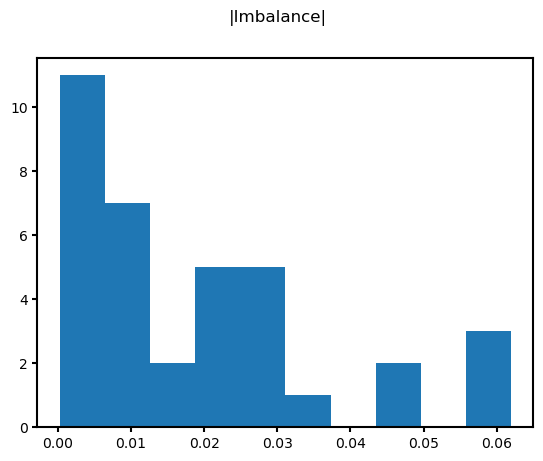

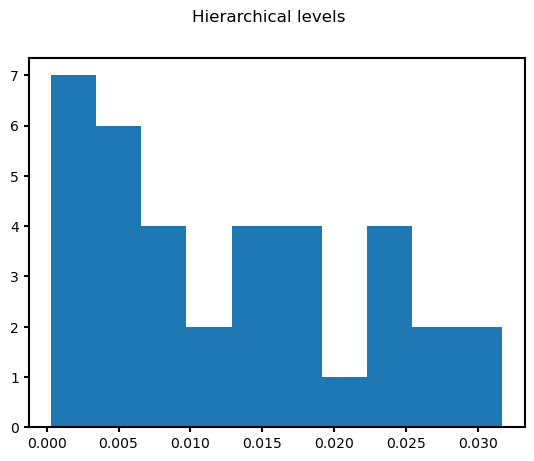

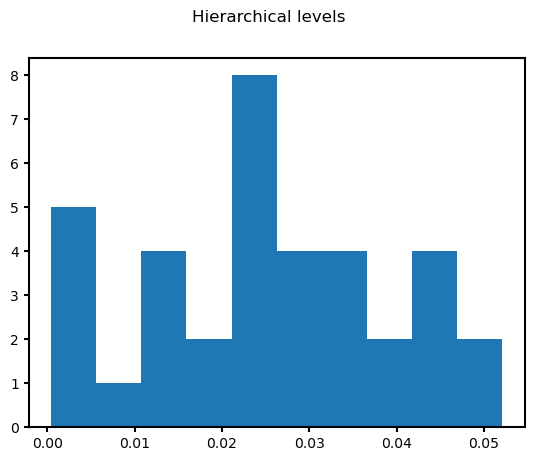

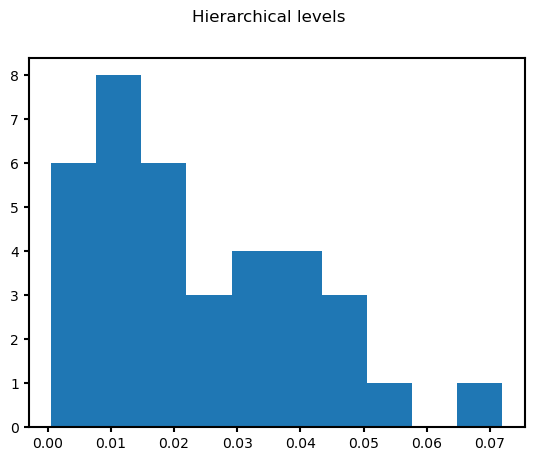

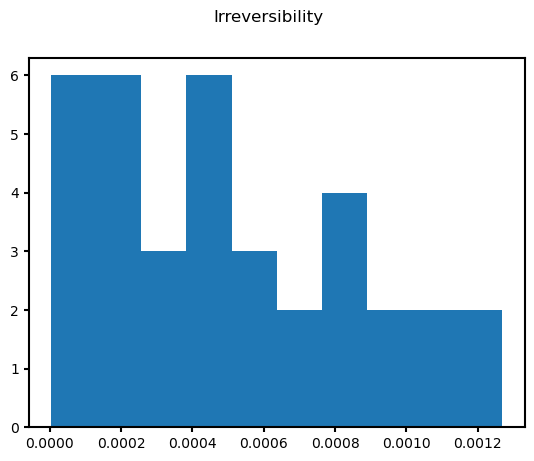

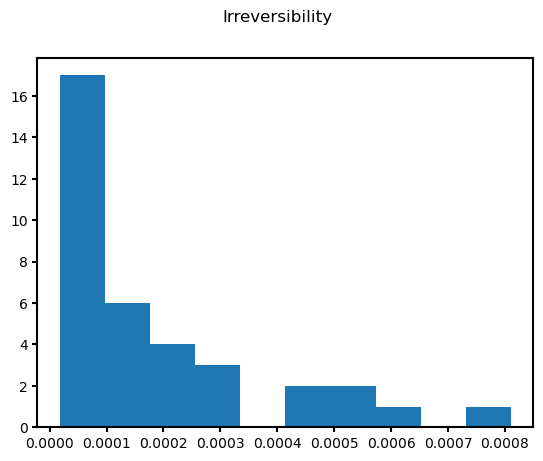

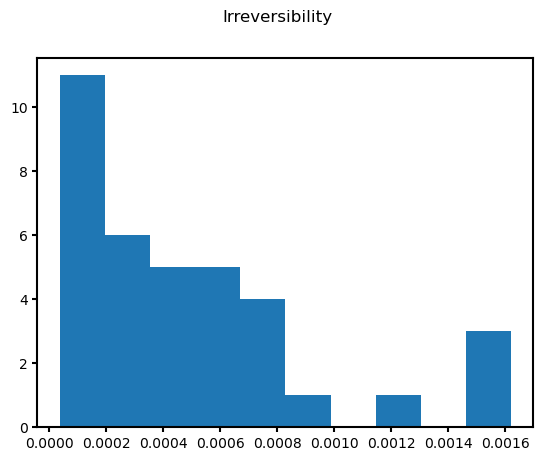

In [59]:
# Subcortical
for m_i, measure_n in enumerate(measure_name):
    brains = []
    measure = measures[m_i]
    for g in groups_order:
        brains.append(np.median(measure[np.where(subjects_group==g)], axis=0))
    # Let's compute the differences
    # |C-B|
    diff = np.abs(brains[0]-brains[1])
    fig = plt.figure()
    fig.suptitle(measure_n)
    plt.hist(diff[200:])
    # |C-NB|
    diff = np.abs(brains[0]-brains[2])
    fig = plt.figure()
    fig.suptitle(measure_n)
    plt.hist(diff[200:])
    # |B-NB|
    diff = np.abs(brains[1]-brains[2])
    fig = plt.figure()
    fig.suptitle(measure_n)
    plt.hist(diff[200:])

In [68]:
networks

array(['Cont', 'Default', 'DorsAttn', 'Limbic', 'SalVentAttn', 'SomMot',
       'Subcortical', 'Vis'], dtype=object)

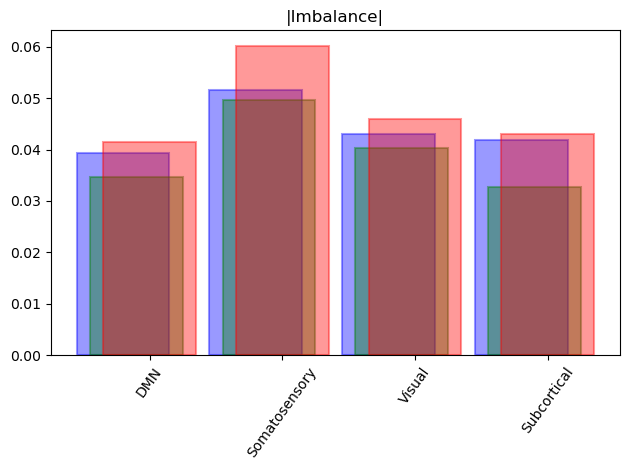

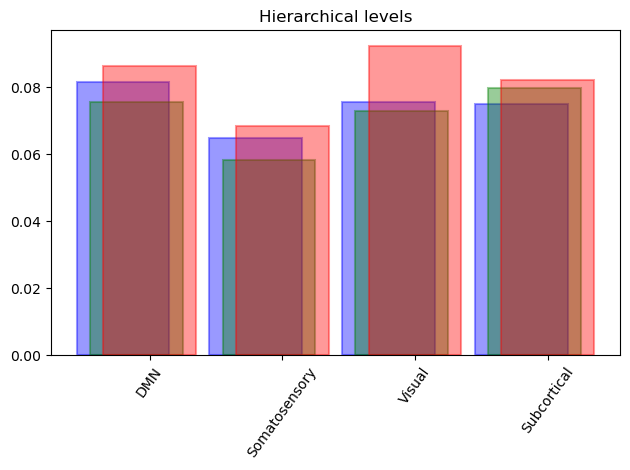

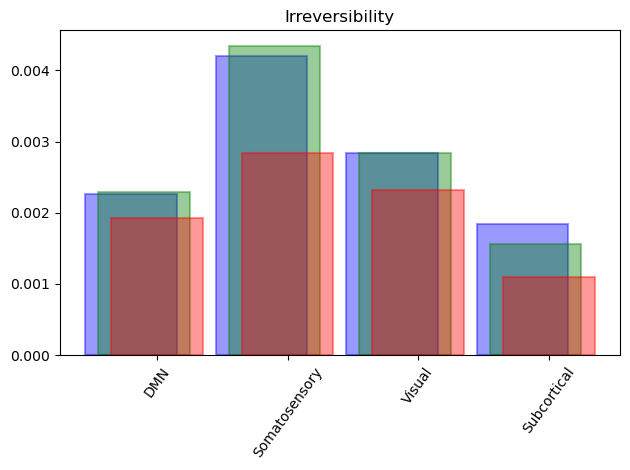

In [64]:
measure_name = ['|Imbalance|','Hierarchical levels', 'Irreversibility']
net_or_state = 'ROI_state'
if net_or_state=='ROI_network':
    network_per_area = atlas_labels['ROI_network'].values
    nets=networks
else:
    network_per_area = atlas_labels['ROI_state'].values
    nets = ['DMN', 'Somatosensory','Visual','Subcortical']


network_per_area = atlas_labels[net_or_state].values
measures = [imbalance, hierarchicallevels, I_per_area]
col_dic = {'C':'b','B':'g','NB':'r'}
for m_i, measure_n in enumerate(measure_name):
    fig,ax = plt.subplots(1,)
    for g_i, g in enumerate(['C','B','NB']):
        where_g = np.where(subjects_group==g)
        if m_i==0:
            measure = np.abs(measures[m_i][where_g])
        else:
            measure = measures[m_i][where_g]
        mean_mes = np.mean(measure, axis=0)
        mean_mes_reord = np.zeros((len(nets),))
        # Reoder the areas per network
        for n_i, network in enumerate(nets):
            idx = atlas_labels.loc[atlas_labels[net_or_state]==network].index.values
            mean_mes_reord[n_i] = mean_mes[idx].mean()
        plt.bar([x+g_i*0.1 for x in range(1,len(nets)+1)], np.abs(mean_mes_reord), color=col_dic[g], alpha=0.4,tick_label=nets, width=0.7,
                edgecolor=col_dic[g], linewidth=1.5)
        ax.set_xticklabels(nets, rotation=54)
    plt.title(measure_n)
    plt.tight_layout()
    if net_or_state=='ROI_networks':
        plt.savefig('output_global_Malta/'+measure_n+'_networks_barplot.png',dpi=200)
    else:
        plt.savefig('output_global_Malta_states/'+measure_n+'_networks_barplot.png',dpi=200)        

/tmp/ipykernel_244257/1620299420.py:25: RuntimeWarning: Mean of empty slice.
  minchia = mess[np.where(network_per_area_sort==net)].mean()
/home/alessio/miniconda3/envs/enigma/lib/python3.12/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DorsAttn_C vs. DorsAttn_B: Brunner-Munzel test, P_val:4.175e-01 W=8.257e-01
Limbic_C vs. Limbic_B: Brunner-Munzel test, P_val:9.329e-03 W=-2.954e+00
SalVentAttn_C vs. SalVentAttn_B: Brunner-Munzel test, P_val:5.143e-01 W=6.658e-01
SomMot_C vs. SomMot_B: Brunner-Munzel test, P_val:7.153e-01 W=3.694e-01
Subcortical_C vs. Subcortical_B: Brunner-Munzel test, P_val:5.186e-01 W=-6.583e-01
Vis_C vs. Vis_B: Brunner-Munzel test, P_val:9.098e-01 W=1.150e-01
Default_B vs. Default_NB: Brunner-Munzel test, P_val:9.237e-01 W=9.792e-02
DorsAttn_B vs. DorsAttn_NB: Brunner-Munzel test, P_val:9.259e-01 W=9.559e-02
Limbic_B vs. Limbic_NB: Brunner-Munzel test, P_val:3.315e-02 W=2.646e+00
SalVentAttn_B vs. SalVentAttn_NB: Brunner-Munzel test, P_val:1.000e+00 W=0.000e+00
SomMot_B vs. SomMot_NB: Brunner-Munzel test, P_val:5.526e-0

/tmp/ipykernel_244257/1620299420.py:25: RuntimeWarning: Mean of empty slice.
  minchia = mess[np.where(network_per_area_sort==net)].mean()
/home/alessio/miniconda3/envs/enigma/lib/python3.12/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DorsAttn_C vs. DorsAttn_B: Brunner-Munzel test, P_val:7.911e-01 W=2.717e-01
Limbic_C vs. Limbic_B: Brunner-Munzel test, P_val:6.837e-01 W=-4.164e-01
SalVentAttn_C vs. SalVentAttn_B: Brunner-Munzel test, P_val:9.455e-02 W=-1.748e+00
SomMot_C vs. SomMot_B: Brunner-Munzel test, P_val:5.079e-01 W=6.768e-01
Subcortical_C vs. Subcortical_B: Brunner-Munzel test, P_val:6.004e-01 W=-5.383e-01
Vis_C vs. Vis_B: Brunner-Munzel test, P_val:4.785e-01 W=7.273e-01
Default_B vs. Default_NB: Brunner-Munzel test, P_val:8.491e-01 W=1.940e-01
DorsAttn_B vs. DorsAttn_NB: Brunner-Munzel test, P_val:8.806e-01 W=-1.532e-01
Limbic_B vs. Limbic_NB: Brunner-Munzel test, P_val:7.892e-03 W=3.096e+00
SalVentAttn_B vs. SalVentAttn_NB: Brunner-Munzel test, P_val:9.171e-01 W=1.061e-01
SomMot_B vs. SomMot_NB: Brunner-Munzel test, P_val:7.596e

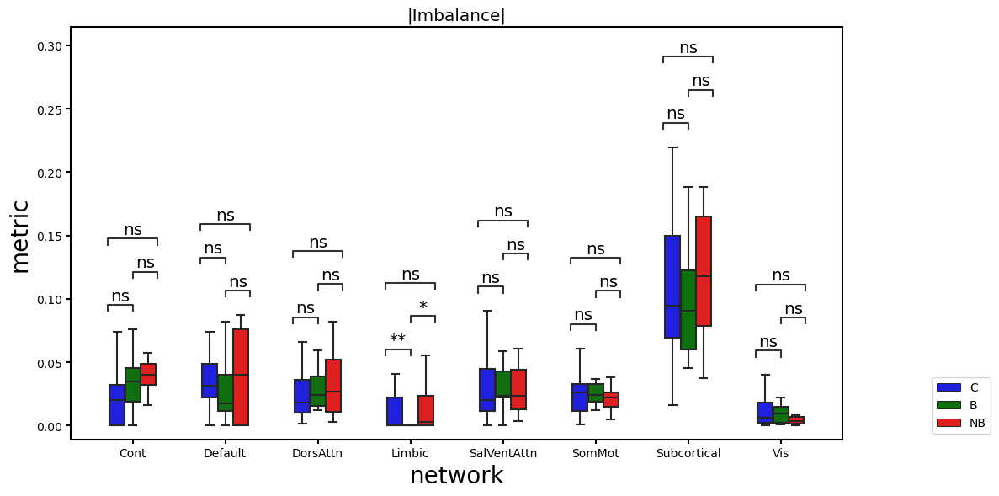

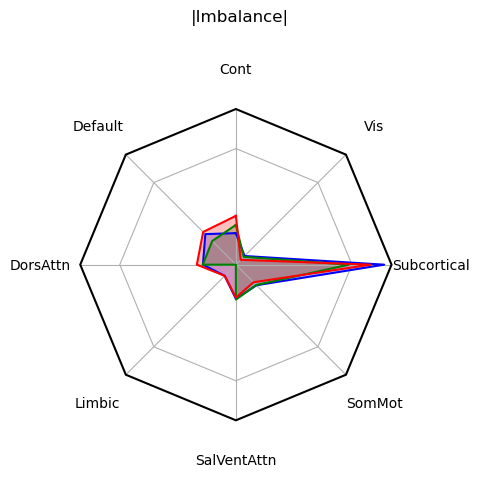

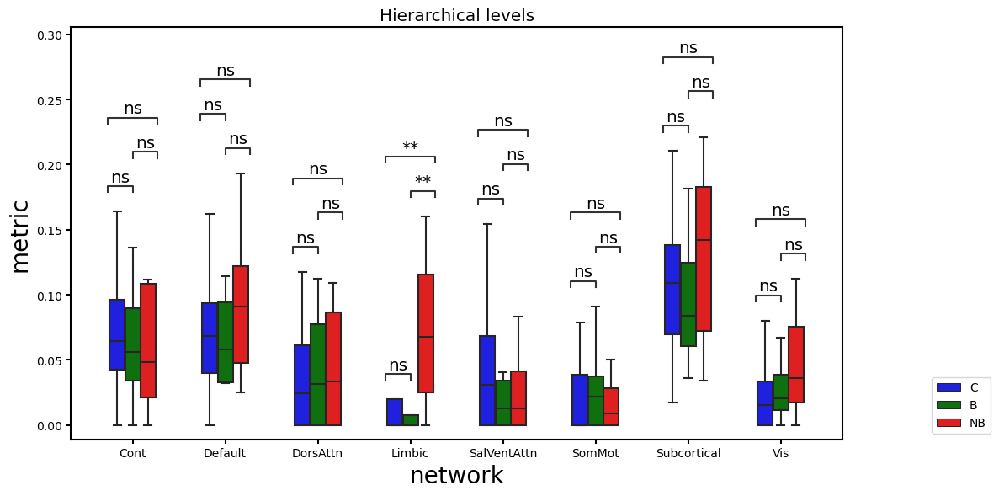

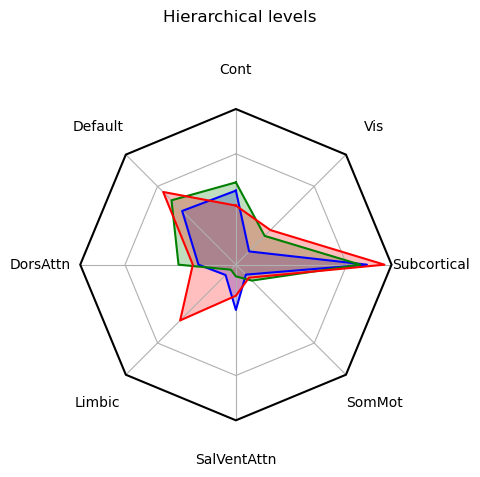

In [136]:
# PLot the distribution of hierarchical levels and imbalance per group per labels
measure_name = ['|Imbalance|','Hierarchical levels']
network_per_area = atlas_labels['ROI_network'].values
top_nodes_ = True
for m_i, measure in enumerate([imbalance, hierarchicallevels]):
    group_all = []
    net_all = []
    mes_all = []
    for i,group in enumerate(subjects_group):
        mes_ = np.copy(measure[i])
        if measure_name[m_i]=='|Imbalance|':
            mes_ = np.abs(mes_)
        mes = np.sort(mes_)
        mes_arg = np.argsort(mes_)
        network_per_area = atlas_labels['ROI_network'].values
        if top_nodes_:
            # Take the n-top nodes based on the rank of the current measure
            top_nodes = mes_arg[-top_tail:]
            network_per_area_sort = network_per_area[top_nodes]
            mess = mes[top_nodes]
        else:
            mess = mes
            network_per_area_sort = network_per_area[mes_arg]
        for net in networks:
            minchia = mess[np.where(network_per_area_sort==net)].mean()
            if np.isnan(minchia):
                minchia = 0
            mes_all.append(minchia)
            net_all.append(net)
            group_all.append(group)
    
    # PLOT WITH STATISTICS
    df_metrics = pd.DataFrame(data = {'metric': mes_all, 'groups': group_all, 'network':net_all})

    groups_order = ['C', 'B', 'NB']
    pairs = [[(net,'C'),(net,'B')] for net in networks] + \
             [[(net,'C'),(net,'NB')] for net in networks] + \
             [[(net,'B'),(net,'NB')] for net in networks]
    my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
    annot_test =  'Brunner-Munzel'
    
    hue_plot_params = {
        'data': df_metrics,
        'x': 'network',
        'y': 'metric',
        "order": networks,
        "hue": 'groups',
        "hue_order": groups_order,
        "palette": my_pal
    }
    
    fig,ax = plt.subplots(1,1, figsize=(12,6))
    with sns.plotting_context("notebook", font_scale = 1.2):
        # Create new plot
    #     ax = get_log_ax()
    
        # Plot with seaborn
        sns.boxplot(ax=ax, **hue_plot_params,
                         showfliers=False,
                         width=0.5)
        
        # Add annotations
        annotator = Annotator(ax, pairs, **hue_plot_params)
        annotator.configure(test=annot_test, text_format='star', loc='inside')
                            # ,comparisons_correction='Benjamini-Hochberg')
        annotator._pvalue_format.pvalue_thresholds =  [[0.0001, '****'], [0.001, '***'], [0.01, '**'], [0.05, '*'], [1, 'ns']]
        _, stat = annotator.apply_and_annotate()
        ax.set_xlabel('network',fontsize=20)
        ax.set_ylabel('metric', fontsize=20)
    
        # Label and show
        plt.legend(loc='lower right', fontsize=10, bbox_to_anchor=(1.2, 0))
        plt.title(measure_name[m_i])
    plt.tight_layout()

    # plt.savefig('output_global/'+measure_name[m_i]+'_top'+str(n)+'_radar.png', dpi=200)

    # RADAR
    count_for_radar = []
    for g in range(3): 
        df_metrics_g = df_metrics.loc[df_metrics['groups']==groups_order[g]]
        coun = [df_metrics_g.loc[df_metrics_g['network']==net]['metric'].values.mean() for net in networks]
        count_for_radar.append(coun)
        
    fig = make_radar(networks, count_for_radar, groups_order, measure_name[m_i])
    # break

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: Brunner-Munzel test, P_val:2.788e-01 W=-1.084e+00
B vs. NB: Brunner-Munzel test, P_val:8.163e-04 W=3.381e+00
C vs. NB: Brunner-Munzel test, P_val:9.076e-03 W=2.625e+00
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DorsAttn_C vs. DorsAttn_B: Brunner-Munzel test, P_val:3.017e-01 W=1.065e+00
Limbic_C vs. Limbic_B: Brunner-Munzel test, P_val:9.329e-03 W=-2.954e+00
SalVentAttn_C vs. SalVentAttn_B: Brunner-Munzel test, P_val:3.367e-01 W=1.006e+00
SomMot_C vs. SomMot_B: Brunner-Munzel test, P_val:7.244e-01 W=3.606e-01
Subcortical_C vs. Subcortical_B: Brunner-Munzel test, P_val:7.515e-01 W=-3.284e-01
Vis_C vs. Vis_B: Brunner-Munzel test, P_val:4.383e-01 W=7.903e-01
Default_B

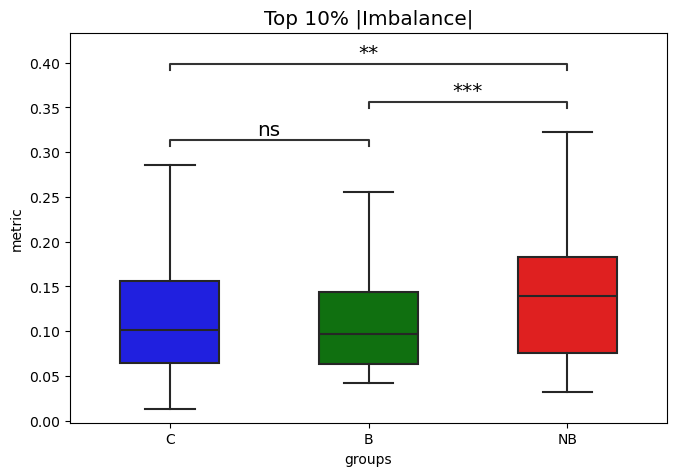

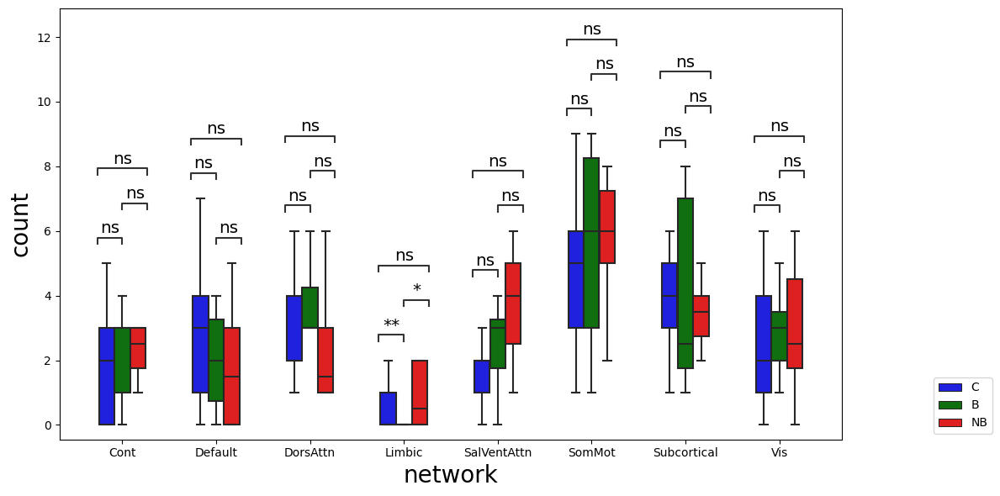

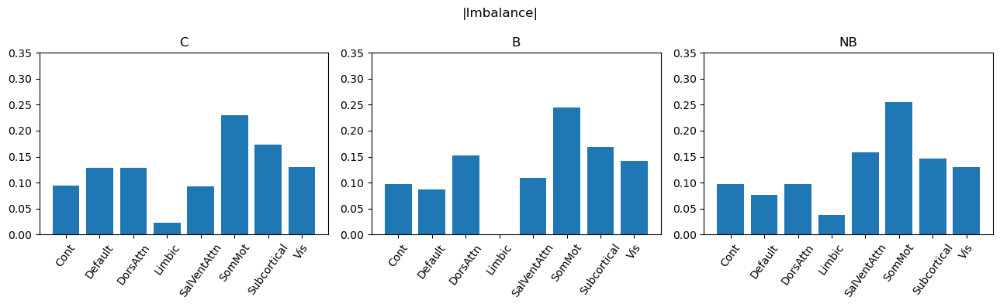

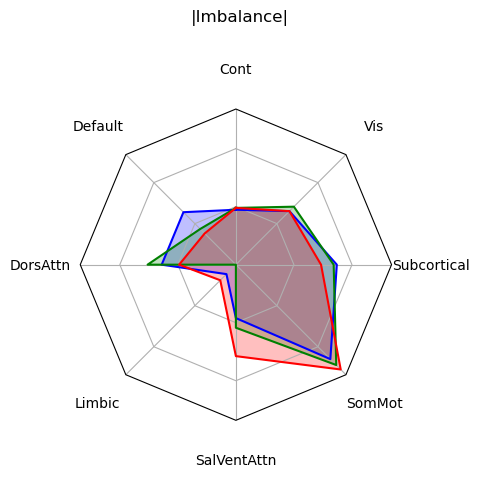

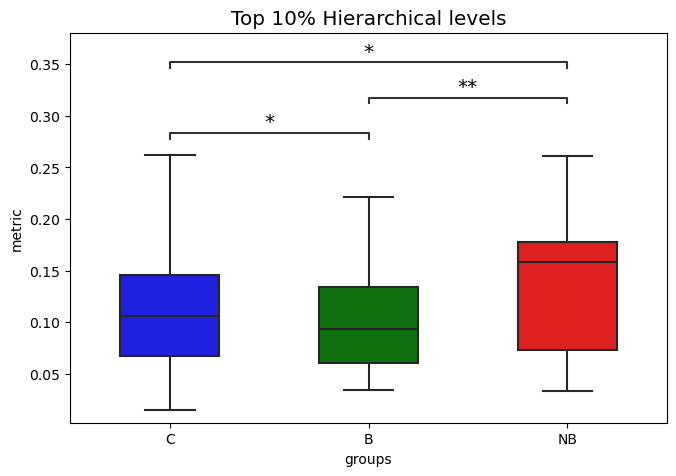

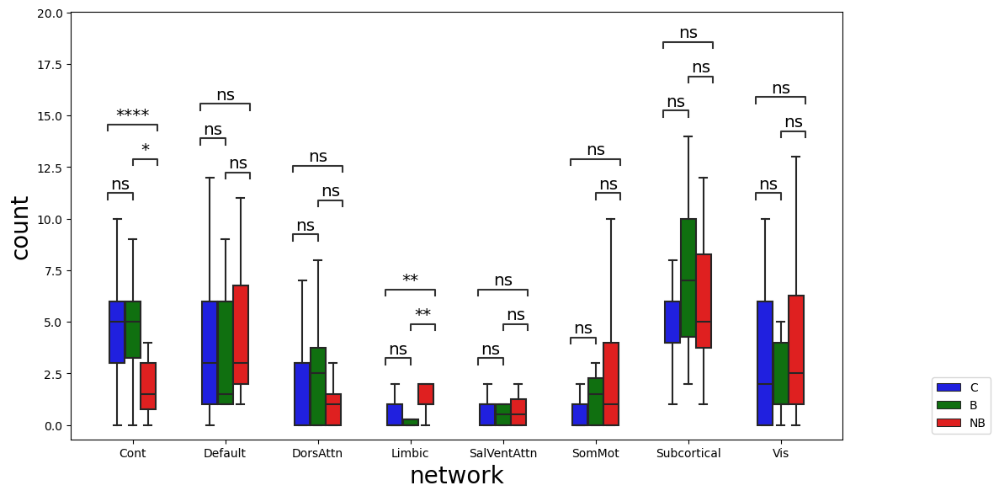

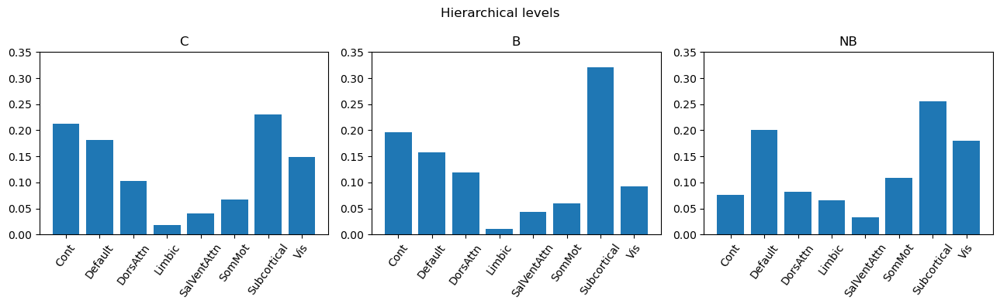

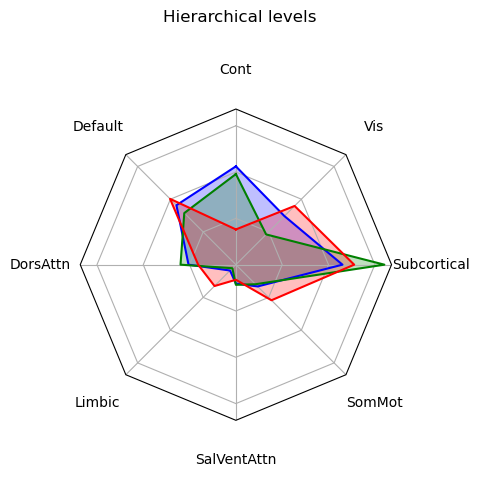

In [235]:
# Find the best n% of the rank
n = 10
top_tail = int(236/100*n)
tot_per_g = [17*top_tail, 8*top_tail, 8*top_tail]
measure_name = ['|Imbalance|','Hierarchical levels']
for m_i, measure in enumerate([imbalance, hierarchicallevels]):
    mes_C = []
    mes_B = []
    mes_NB = []
    count_dic = {'C':{}, 
                 'B':{},
                 'NB':{}}

    count_all = []
    nets_all = []
    groups_all = []
    groups_nodes_all = []
    top_nodes_all = []
    for i,group in enumerate(subjects_group):
        mes_ = np.copy(measure[i])
        if measure_name[m_i]=='|Imbalance|':
            mes_ = np.abs(mes_)
        mes = np.sort(mes_)
        mes_arg = np.argsort(mes_)
        # Take the n-top nodes based on the rank of the current measure
        # print(mes_arg[-top_tail:])
        top_nodes = mes_arg[-top_tail:]
        # print(top_nodes.shape)
        top_nodes_all = top_nodes_all + mes[-top_tail:].tolist()
        groups_nodes_all = groups_nodes_all + [group]*top_tail
        # print(len(top_nodes_all), len(groups_nodes_all))

        top_nodes_count = count_node_per_net(top_nodes, networks, atlas_labels)
        for net in top_nodes_count.keys():
            count_all.append(top_nodes_count[net])
            nets_all.append(net)
            groups_all.append(group)

            if net in count_dic[group]:
                count_dic[group][net] += top_nodes_count[net]
            else:
                count_dic[group][net] = top_nodes_count[net]
            

    # PLOT THE DISTRIBUTION OF THE TOP 10%
    # I put together all the top area of all the patients of a group
    pairs = [('C','B'),('C','NB'),('B','NB')]
    df = pd.DataFrame({'metric':top_nodes_all, 'groups':groups_nodes_all})
    hue_plot_params = {
        'data': df,
        'x': 'groups',
        'y': 'metric',
        "order": ['C','B','NB'],
        "palette": my_pal
    }
    fig,ax = plt.subplots(1,1, figsize=(7,5))
    with sns.plotting_context("notebook", font_scale = 1.2):
        sns.boxplot(**hue_plot_params, showfliers=False, width=0.5, ax=ax)
        annotator = Annotator(ax, pairs, **hue_plot_params)
        annotator.configure(test=annot_test, text_format='star', loc='inside')
                            # ,comparisons_correction='Benjamini-Hochberg')
        _, stat = annotator.apply_and_annotate()
        plt.title('Top 10% '+measure_name[m_i])
        plt.tight_layout()
    
    plt.savefig('output_global/'+measure_name[m_i]+'_top'+str(n)+'_distr.png', dpi=200)
    
    # # PLOT WITH STATISTICS
    # df_metrics = pd.DataFrame(data = {'count': count_all, 'groups': groups_all, 'network':nets_all})

    # groups_order = ['C', 'B', 'NB']
    # pairs = [[(net,'C'),(net,'B')] for net in networks] + \
    #          [[(net,'C'),(net,'NB')] for net in networks] + \
    #          [[(net,'B'),(net,'NB')] for net in networks]
    # my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
    # annot_test =  'Brunner-Munzel'
    
    # hue_plot_params = {
    #     'data': df_metrics,
    #     'x': 'network',
    #     'y': 'count',
    #     "order": networks,
    #     "hue": 'groups',
    #     "hue_order": groups_order,
    #     "palette": my_pal
    # }
    
    # fig,ax = plt.subplots(1,1, figsize=(12,6))
    # with sns.plotting_context("notebook", font_scale = 1.2):
    #     # Create new plot
    # #     ax = get_log_ax()
    
    #     # Plot with seaborn
    #     sns.boxplot(ax=ax, **hue_plot_params,
    #                      showfliers=False,
    #                      width=0.5)
        
    #     # Add annotations
    #     annotator = Annotator(ax, pairs, **hue_plot_params)
    #     annotator.configure(test=annot_test, text_format='star', loc='inside')
    #                         # ,comparisons_correction='Benjamini-Hochberg')
    #     annotator._pvalue_format.pvalue_thresholds =  [[0.0001, '****'], [0.001, '***'], [0.01, '**'], [0.05, '*'], [1, 'ns']]
    #     _, stat = annotator.apply_and_annotate()
    #     ax.set_xlabel('network',fontsize=20)
    #     ax.set_ylabel('count', fontsize=20)
    
    #     # Label and show
    #     plt.legend(loc='lower right', fontsize=10, bbox_to_anchor=(1.2, 0))
    # plt.tight_layout()

    # PLOT WITHOUT STATISTICS
    fig, axs = plt.subplots(1,3, figsize=(13, 4))
    fig.suptitle(measure_name[m_i])
    for g in range(3): 
        countz = count_dic[groups_order[g]]
        
        axs[g].bar(x=np.arange(len(networks)), height=[v/tot_per_g[g] for v in countz.values()], tick_label=networks)
        axs[g].set_xticklabels(networks, rotation=54)
        axs[g].set_ylim(0,0.35)
        axs[g].set_title(groups_order[g])
    plt.tight_layout()
    plt.savefig('output_global/'+measure_name[m_i]+'_top'+str(n)+'_bars.png', dpi=200)


    # RADAR
    count_for_radar = []
    for g in range(3): 
        countz = count_dic[groups_order[g]]
        coun = [v/tot_per_g[g] for v in countz.values()]
        count_for_radar.append(coun)
        
    fig = make_radar(networks, count_for_radar, groups_order, measure_name[m_i])
    # plt.savefig('output_global/'+measure_name[m_i]+'_top'+str(n)+'_radar.png', dpi=200)

        
    # break

## Now look at a single area-level

# makeradar

In [56]:
from matplotlib.patches import Circle, RegularPolygon
from matplotlib.path import Path
from matplotlib.projections.polar import PolarAxes
from matplotlib.projections import register_projection
from matplotlib.spines import Spine
from matplotlib.transforms import Affine2D

# Data has to be in the form of a nested list lines x vertex

def radar_factory(num_vars, frame='circle'):
    """
    Create a radar chart with `num_vars` axes.

    This function creates a RadarAxes projection and registers it.

    Parameters
    ----------
    num_vars : int
        Number of variables for radar chart.
    frame : {'circle', 'polygon'}
        Shape of frame surrounding axes.

    """
    # calculate evenly-spaced axis angles
    theta = np.linspace(0, 2*np.pi, num_vars, endpoint=False)

    class RadarTransform(PolarAxes.PolarTransform):

        def transform_path_non_affine(self, path):
            # Paths with non-unit interpolation steps correspond to gridlines,
            # in which case we force interpolation (to defeat PolarTransform's
            # autoconversion to circular arcs).
            if path._interpolation_steps > 1:
                path = path.interpolated(num_vars)
            return Path(self.transform(path.vertices), path.codes)

    class RadarAxes(PolarAxes):

        name = 'radar'
        PolarTransform = RadarTransform

        def __init__(self, *args, **kwargs):
            super().__init__(*args, **kwargs)
            # rotate plot such that the first axis is at the top
            self.set_theta_zero_location('N')

        def fill(self, *args, closed=True, **kwargs):
            """Override fill so that line is closed by default"""
            return super().fill(closed=closed, *args, **kwargs)

        def plot(self, *args, **kwargs):
            """Override plot so that line is closed by default"""
            lines = super().plot(*args, **kwargs)
            for line in lines:
                self._close_line(line)

        def _close_line(self, line):
            x, y = line.get_data()
            # FIXME: markers at x[0], y[0] get doubled-up
            if x[0] != x[-1]:
                x = np.append(x, x[0])
                y = np.append(y, y[0])
                line.set_data(x, y)

        def set_varlabels(self, labels):
            self.set_thetagrids(np.degrees(theta), labels, position=(-0.13,-0.13),
                                horizontalalignment='center', fontsize=10 )

        def _gen_axes_patch(self):
            # The Axes patch must be centered at (0.5, 0.5) and of radius 0.5
            # in axes coordinates.
            if frame == 'circle':
                return Circle((0.5, 0.5), 0.5)
            elif frame == 'polygon':
                return RegularPolygon((0.5, 0.5), num_vars,
                                      radius=.5, edgecolor="k")
            else:
                raise ValueError("Unknown value for 'frame': %s" % frame)

        def _gen_axes_spines(self):
            if frame == 'circle':
                return super()._gen_axes_spines()
            elif frame == 'polygon':
                # spine_type must be 'left'/'right'/'top'/'bottom'/'circle'.
                spine = Spine(axes=self,
                              spine_type='circle',
                              path=Path.unit_regular_polygon(num_vars))
                # unit_regular_polygon gives a polygon of radius 1 centered at
                # (0, 0) but we want a polygon of radius 0.5 centered at (0.5,
                # 0.5) in axes coordinates.
                spine.set_transform(Affine2D().scale(.5).translate(.5, .5)
                                    + self.transAxes)
                return {'polar': spine}
            else:
                raise ValueError("Unknown value for 'frame': %s" % frame)

    register_projection(RadarAxes)
    return theta

def make_radar(vertex_ticks, data, labels, title):
    N = len(vertex_ticks)
    theta = radar_factory(N, frame='circle')
    
    
    fig, axs = plt.subplots(figsize=(5, 5), nrows=1, ncols=1,
                            subplot_kw=dict(projection='radar'))
    fig.suptitle(title)
    fig.subplots_adjust(wspace=0.25, hspace=0.20, top=0.85, bottom=0.05)
    
    colors = ['b', 'g', 'r']
    # Plot the four cases from the example data on separate axes
    # axs.set_rgrids([5, 10, 15, 20, 25])
    # axs.set_title('cane', weight='bold', size='medium', position=(0.5, 1.1),
    #              horizontalalignment='center', verticalalignment='center')
    
    
    for d, color in zip(data, colors):
        axs.plot(theta, d, color=color)
    #     axs.set_rticks([0.25,0.5, 0.75], labels=[])
    #     axs.set_rlabel_position(-360/5)
        axs.set_rticks([0.1,0.2, 0.3], labels=[])
        axs.set_rlabel_position(-60)
        axs.fill(theta, d, facecolor=color, alpha=0.25, label='_nolegend_')
    axs.set_varlabels(vertex_ticks)
    
    # add legend relative to top-left plot
    # legend = axs.legend(labels, loc=(0.8, .85),
    #                           labelspacing=0.1, fontsize=12)
    
    # plt.show()
    plt.tight_layout()

# Perturbation???

## Response to perturbation in V1

In [207]:
# Take the average among healthy subjects
# Compute the difference in the activity between average of the healthy subjects and pateints
perturb_labels = ['L_V1','R_V1']
dF0 = 0.01
Fmax = 0.1
group_idx = {'C':0, 'B':1, 'NB':2}
for p_i,p in enumerate(perturb_labels): # Loop over perturbed areas
    pat_conc_pert = [[],[],[]]
    for f_i,f in enumerate([dF0*f for f in range(int(Fmax/dF0))]):
        pat_conc = [np.empty((0,236,236)), np.empty((0,236,236)), np.empty((0,236,236))]
        for sub_i,sub in enumerate(subjects_code):
            g = subjects_group[sub_i]
            pert_patient = scipy.io.loadmat('../data/EffectiveConnectivity/perturbations/V1_10sim/Pert_FCsim_'+sub+'.mat')
            pat_conc[group_idx[g]] = np.concatenate((pat_conc[group_idx[g]], pert_patient['FC_pert_all'][p_i][f_i][np.newaxis,:]), axis=0)
        for i in range(3):
            pat_conc_pert[i].append(pat_conc[i])


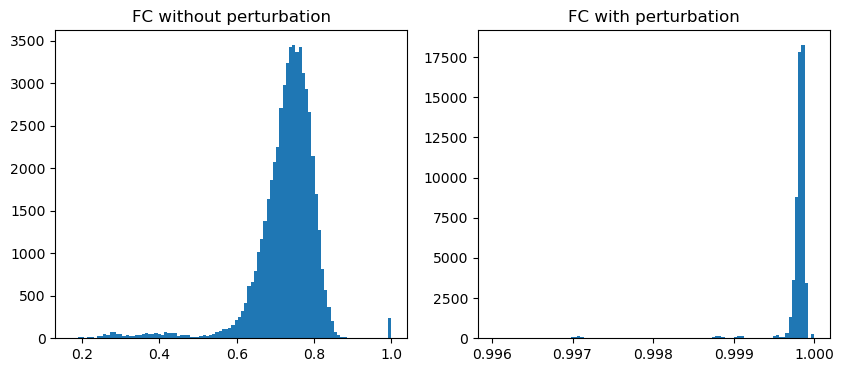

In [208]:
# sns.heatmap(pat_conc_pert[0][0][0])
fig,axs = plt.subplots(1,2, figsize=(10,4))
axs[0].hist(pat_conc_pert[0][0][0].flatten(), alpha=1, bins=100)
axs[1].hist(pat_conc_pert[0][2][0].flatten(), alpha=1, bins=100);
axs[0].set_title('FC without perturbation')
axs[1].set_title('FC with perturbation')
# plt.hist(pat_conc_pert[0][1][0].flatten(), alpha=0.5, bins=100);
plt.savefig('output_global/fc_values_distrib_perturbed', dpi=300)

In [214]:
atlas_labels[200:]

,ROI_label,ROI_name,ROI_network,Hemisphere
200,201,RH_aHIP,Subcortical,RH
201,202,RH_pHIP,Subcortical,RH
202,203,RH_lAMY,Subcortical,RH
203,204,RH_mAMY,Subcortical,RH
204,205,RH_THA_DP,Subcortical,RH
205,206,RH_THA_VP,Subcortical,RH
206,207,RH_THA_VA,Subcortical,RH
207,208,RH_THA_DA,Subcortical,RH
208,209,RH_NAc_shell,Subcortical,RH
209,210,RH_NAc_core,Subcortical,RH


(10, 17, 236, 236)
(10, 8, 236, 236)
(10, 8, 236, 236)


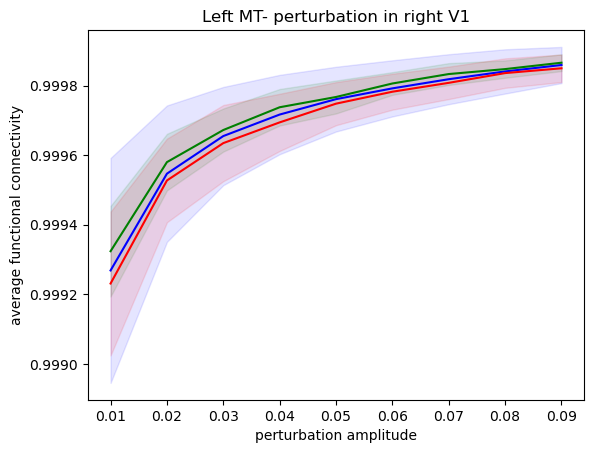

In [226]:
seed_idx = L_MT_idx
# seed_idx = R_MT_idx
# seed_idx = [205,206]
# seed_idx = [220,221]
# seed_idx = [232]
# seed_idx = [233]

colorz=['b','g','r']
x=[dF0*f for f in range(int(Fmax/dF0))][1:]
bold_all_group = []
for g in range(3): # Loop over groups
    pat_conc = np.asarray(pat_conc_pert[g])
    print(pat_conc.shape)
    # fig = plt.figure()
    bold_all = np.empty((0,9))
    for s in range(pat_conc.shape[-3]): # Loop over subjects
        # print(pat_conc[:,s,seed_idx,:].mean(axis=-1).mean(axis=-1).shape)
        bold = pat_conc[:,s,seed_idx,:].mean(axis=-1).mean(axis=-1)
        bold_rate = bold[1:]/bold[0]
        bold_all = np.concatenate((bold_all, bold[np.newaxis,1:]), axis=0)
    bold_all_group.append(bold_all[:,0])
    plt.plot(x, bold_all.mean(axis=0), c=colorz[g])
    plt.fill_between(x,bold_all.mean(axis=0)-bold_all.std(axis=0), bold_all.mean(axis=0)+bold_all.std(axis=0), color=colorz[g], alpha=0.1)
    plt.xlabel('perturbation amplitude')
    plt.ylabel('average functional connectivity')
    plt.title('Left MT- perturbation in right V1')

plt.savefig('output_global/perturbation_effect_example_L_MT', dpi=200)

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: Brunner-Munzel test, P_val:8.141e-01 W=2.385e-01
B vs. NB: Brunner-Munzel test, P_val:2.568e-01 W=-1.182e+00
C vs. NB: Brunner-Munzel test, P_val:3.895e-01 W=-8.861e-01


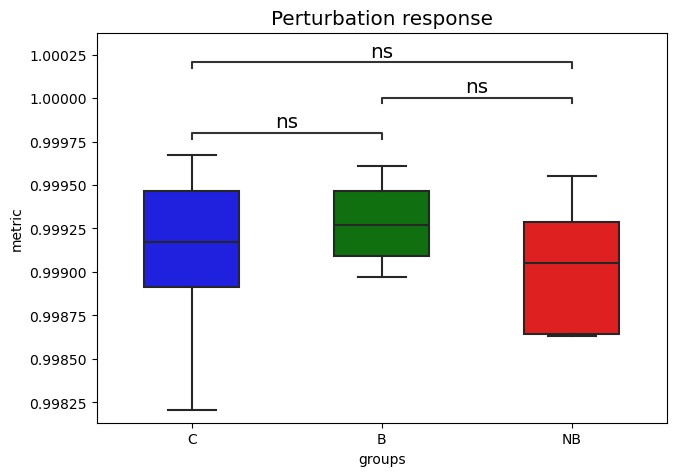

In [223]:
my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
annot_test =  'Brunner-Munzel'
# annot_test = 't-test_ind'
pairs = [('C','B'),('C','NB'),('B','NB')]

mmm = []
ggg = []
o = [['C'],['B'],['NB']]
for i,g in enumerate(bold_all_group):
    mmm += g.tolist()
    ggg += o[i]*len(g)
    
df = pd.DataFrame({'metric':mmm, 'groups':ggg})
hue_plot_params = {
    'data': df,
    'x': 'groups',
    'y': 'metric',
    "order": ['C','B','NB'],
    "palette": my_pal
}
fig,ax = plt.subplots(1,1, figsize=(7,5))
with sns.plotting_context("notebook", font_scale = 1.2):
    sns.boxplot(**hue_plot_params, showfliers=False, width=0.5, ax=ax)
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test=annot_test, text_format='star', loc='inside')
                        # ,comparisons_correction='Benjamini-Hochberg')
    _, stat = annotator.apply_and_annotate()
    plt.title('Perturbation response')
    plt.tight_layout()



<Axes: >

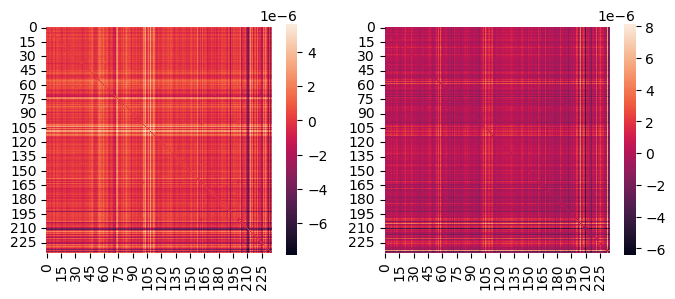

In [28]:
fig,axs = plt.subplots(1,2, figsize=(8,3))
sns.heatmap(pat_diff[0].mean(axis=0), ax=axs[0], square=True)
sns.heatmap(pat_diff[1].mean(axis=0), ax=axs[1], square=True)

## Distance between healthys and patients

In [404]:
# Take the average among subjects
perturb_labels = ['L_MT-V1','R_MT-V1']
dF0 = 0.1
Fmax = 1
group_idx = {'C':0, 'B':1, 'NB':2}
distances = [[], []]
for p_i,p in enumerate(perturb_labels): # Loop over perturbed areas
    for f_i,f in enumerate([dF0*f for f in range(int(Fmax/dF0))]):
        pat_conc = [np.empty((0,236,236)), np.empty((0,236,236)), np.empty((0,236,236))]
        for sub_i,sub in enumerate(subjects_code):
            g = subjects_group[sub_i]
            pert_patient = scipy.io.loadmat('../data/EffectiveConnectivity/perturbations/MT-V1_100sim/Pert_FCsim_'+sub+'.mat')
            pat_conc[group_idx[g]] = np.concatenate((pat_conc[group_idx[g]], pert_patient['FC_pert_all'][p_i][f_i][np.newaxis,:]), axis=0)
        # Compute the avereage of the healthy and compute the distance with all the B and NB patients
        h_av = np.mean(pat_conc[0], axis=0)
        for gr_i, gr in enumerate(pat_conc[1:]):
            pat_dis = []
            for pat in gr:
                 # pat_dis.append(ssim(h_av, pat, data_range=2)) # B+
                 pat_dis.append(pearsonr(h_av.flatten(), pat.flatten())[0]) # B+
            distances[gr_i].append(pat_dis)
    break

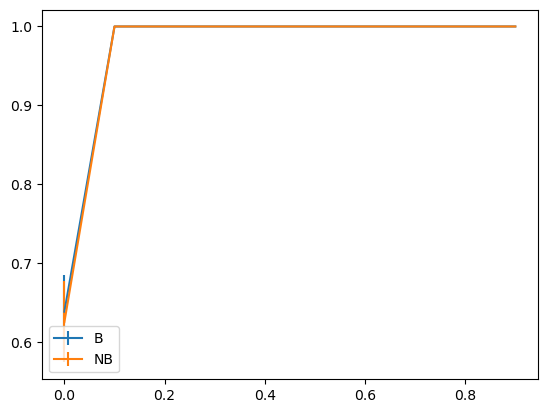

In [403]:
x=[dF0*f for f in range(int(Fmax/dF0))]
plt.errorbar(x, np.asarray(distances[0]).mean(axis=1), yerr=np.asarray(distances[0]).std(axis=1), label='B')
plt.errorbar(x, np.asarray(distances[1]).mean(axis=1), yerr=np.asarray(distances[1]).std(axis=1), label='NB')
# plt.yscale('log')
plt.legend()

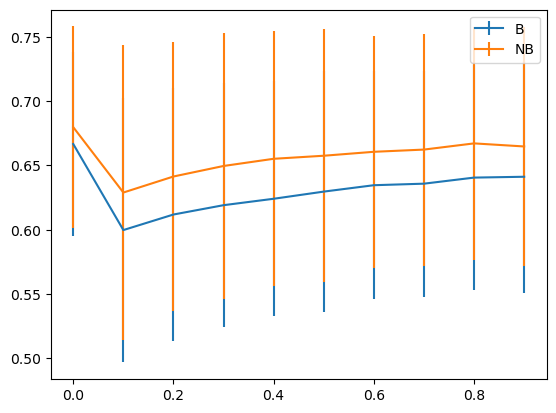

In [405]:
x=[dF0*f for f in range(int(Fmax/dF0))]
plt.errorbar(x, np.asarray(distances[0]).mean(axis=1), yerr=np.asarray(distances[0]).std(axis=1), label='B')
plt.errorbar(x, np.asarray(distances[1]).mean(axis=1), yerr=np.asarray(distances[1]).std(axis=1), label='NB')
# plt.yscale('log')
plt.legend()